# Figures for Paper Pollak et al. 2025

This Jupyter Notebook contains all the code needed to recreate the figures (and supplementary figures) from Pollak et al. 2025

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import math
import matplotlib.patches as mpatches
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
from astropy.timeseries import LombScargle
import seaborn as sns
sns.set_theme()
%matplotlib widget


# Define color
import tol_colors as tc
bright = tc.tol_cset('bright')

# Use Arial 
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Arial']})

%matplotlib widget


## 1. Figure 1 - v0(t) and tau(t)

In [2]:
# From 2.6 Myr RAMP 
t2 = 2159.346069989433
t1 =  857.9325641775804
v0_prime = -12.916000589465284
v0 = 98.38769322382691
taud0_prime = 31.417498351214654
taud0 =  6.337560462113291

In [3]:
time = np.arange(2600, -1, -1)
print(time)

v0_t = []
tau_t = []

for i in range(2601):
    # current time t
    t = 2600-i 
    
    # t>t2: Before Ramp
    if t>t2:
        tau_t += [taud0_prime] 
        v0_t += [v0_prime]
        
    # t2>=t>=t1: Ramp
    elif t2>=t>=t1:
        # tau(t) = taud0 - (taud0-taud0')/(t2-t1) * (t-t1)
        tau_t += [taud0 - ((taud0-taud0_prime)/np.abs(t2-t1)) * np.abs(t-t1)]    

        # v0(t) = v0 - (v0-v0')/(t2-t1) * (t-t1)
        v0_t += [v0 - ((v0-v0_prime)/np.abs(t2-t1)) * np.abs(t-t1)] 
    
    # t1>t: After Ramp
    else:
        tau_t += [taud0]
        v0_t += [v0]



[2600 2599 2598 ...    2    1    0]


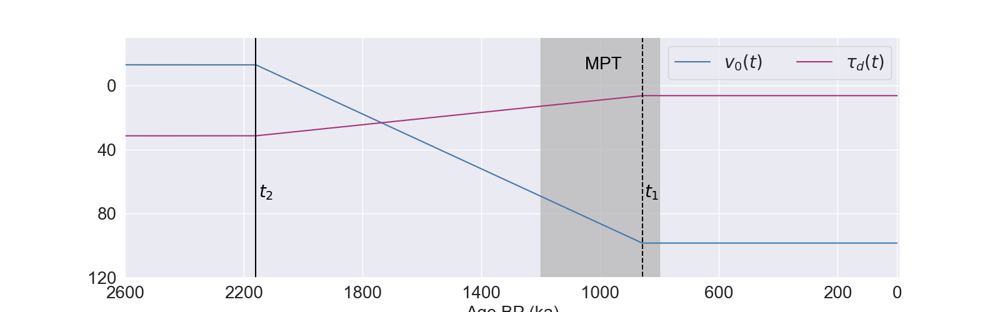

In [4]:
%matplotlib notebook

font = 20

plt.close('all')
fig = plt.figure(figsize=(16,5))

# fig.tight_layout(pad=5.0)

plt.plot(time, v0_t, color=bright.blue, label=r"$v_0(t)$")
plt.plot(time, tau_t, color=bright.purple, label=r"$\tau_d(t)$")
plt.vlines(x=t2, ymin=-30, ymax=120, linestyle='-', color=bright.black)
plt.text(x=2150, y=70, s=r'$t_2$', color=bright.black, fontsize=font)
plt.vlines(x=t1, ymin=-30, ymax=120, linestyle='--', color=bright.black)
plt.text(x=850, y=70, s=r'$t_1$', color=bright.black, fontsize=font)

plt.xlim(2600,-10)
plt.ylim(-30,120)
plt.gca().invert_yaxis()
plt.xticks([2600, 2200, 1800, 1400, 1000, 600, 200, 0], fontsize=font)
plt.yticks([120, 80, 40, 0], fontsize=font)
plt.xlabel("Age BP (ka)",fontsize=font)
# plt.ylabel("Ice volume (m sl)",fontsize=font)

# add shaded area for MPT
plt.axvspan(1200, 800, color=bright.grey, alpha=0.8)
plt.text(x=1050, y=-10, s='MPT', color=bright.black, fontsize=font)


plt.legend(ncol=2, fontsize=font)
plt.savefig('Plots/f01.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 2. Figure 2 - Model comparison 2.6 Myr

In [5]:
# load pickled data sets
with open('Data/ORB2_jax_2,6Myr.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_2,6Myr.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_2,6Myr.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)

with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)
    
    
# calculate the rmse
rmse_orb = np.sqrt(np.sum((ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])**2)/len(ORB_data['sea']))
rmse_abr = np.sqrt(np.sum((ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea'])**2)/len(ABR_data['sea']))
rmse_grad = np.sqrt(np.sum((GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea'])**2)/len(GRAD_data['sea']))
rmse_ramp = np.sqrt(np.sum((RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea'])**2)/len(RAMP_data['sea']))
rmse_rampl = np.sqrt(np.sum((RAMPl_data['icevolume'][:len(RAMPl_data['sea'])]-RAMPl_data['sea'])**2)/len(RAMPl_data['sea']))

r2_orb = r2_score(y_pred=ORB_data['icevolume'][:len(ORB_data['sea'])], y_true=ORB_data['sea'])
r2_abr = r2_score(y_pred=ABR_data['icevolume'][:len(ABR_data['sea'])], y_true=ABR_data['sea'])
r2_grad = r2_score(y_pred=GRAD_data['icevolume'][:len(GRAD_data['sea'])], y_true=GRAD_data['sea'])
r2_ramp = r2_score(y_pred=RAMP_data['icevolume'][:len(RAMP_data['sea'])], y_true=RAMP_data['sea'])
r2_rampl = r2_score(y_pred=RAMPl_data['icevolume'][:len(RAMPl_data['sea'])], y_true=RAMPl_data['sea'])

print(rmse_orb, rmse_abr, rmse_grad, rmse_ramp, rmse_rampl)
print(r2_orb, r2_abr, r2_grad, r2_ramp, r2_rampl)

17.498554732440162 12.238494942903529 11.857648096170037 11.384268967313442 10.022636700269848
0.4712038571267513 0.7413336447766542 0.757181913077142 0.7761824105303331 0.826520606591107


In [6]:
time = ORB_data['time']

p1 = 1200
p2 = 800

mask_preMPT = time>=p1
mask_MPT = np.logical_and(p1>=time, time>=p2)
mask_postMPT = np.logical_and(p2>=time, time>=0)
masks_ice = [mask_preMPT, mask_MPT, mask_postMPT]

time_sea = ORB_data['time_sea']
mask_preMPT_sea = time_sea>=p1
mask_MPT_sea = np.logical_and(p1>=time_sea, time_sea>=p2)
mask_postMPT_sea = np.logical_and(p2>=time_sea, time_sea>=0)
masks_sea = [mask_preMPT_sea, mask_MPT_sea, mask_postMPT_sea]

names = ['ORB', 'ABR', 'GRAD', 'RAMP', 'RAMPl']
data = {'ORB': ORB_data, 'ABR': ABR_data, 'GRAD': GRAD_data, 'RAMP': RAMP_data, 'RAMPl': RAMPl_data}
rmses = np.zeros((5,4))
R2s = np.zeros((5,4))

for i, name in enumerate(names):
    for j, mask in enumerate(masks_ice):
        rmses[i,j] = root_mean_squared_error(y_pred=data[name]['icevolume'][mask], y_true=data[name]['sea'][masks_sea[j]])
        R2s[i,j] = r2_score(y_pred=data[name]['icevolume'][mask], y_true=data[name]['sea'][masks_sea[j]])
        if j==2:
            rmses[i,3] = root_mean_squared_error(y_pred=data[name]['icevolume'][:len(time_sea)], y_true=data[name]['sea'])
            R2s[i,3] = r2_score(y_pred=data[name]['icevolume'][:len(time_sea)], y_true=data[name]['sea'])


In [7]:
# First 104 MIS boundaries according to LR04 - till 2614ka
mis_bounds = pd.read_csv('/home/pollakf/Python/Datasets/LR04_MISboundaries.txt', skiprows=2, delimiter='\t\t', usecols=[1], header=None)    #dtype={'a': str, 'b': np.float64}, 
mis_bounds = mis_bounds.iloc[:109,0].to_numpy()

bounds = []
j=1
for i, bound in enumerate(mis_bounds):
    if i==0:
        bounds.append([0,bound,str(j)])
    elif j==4:
        j=j+1
        bounds.append([71.0,130.0,str(j)])
    else:
        if np.isfinite(mis_bounds[i-1]) and np.isfinite(bound):
            j=j+1
            bounds.append([mis_bounds[i-1],bound,str(j)])

bounds

/tmp/ipykernel_30826/2227503278.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  mis_bounds = pd.read_csv('/home/pollakf/Python/Datasets/LR04_MISboundaries.txt', skiprows=2, delimiter='\t\t', usecols=[1], header=None)    #dtype={'a': str, 'b': np.float64},


[[0, 14.0, '1'],
 [14.0, 29.0, '2'],
 [29.0, 57.0, '3'],
 [57.0, 71.0, '4'],
 [71.0, 130.0, '5'],
 [130.0, 191.0, '6'],
 [191.0, 243.0, '7'],
 [243.0, 300.0, '8'],
 [300.0, 337.0, '9'],
 [337.0, 374.0, '10'],
 [374.0, 424.0, '11'],
 [424.0, 478.0, '12'],
 [478.0, 533.0, '13'],
 [533.0, 563.0, '14'],
 [563.0, 621.0, '15'],
 [621.0, 676.0, '16'],
 [676.0, 712.0, '17'],
 [712.0, 761.0, '18'],
 [761.0, 790.0, '19'],
 [790.0, 814.0, '20'],
 [814.0, 866.0, '21'],
 [866.0, 900.0, '22'],
 [900.0, 917.0, '23'],
 [917.0, 936.0, '24'],
 [936.0, 959.0, '25'],
 [959.0, 970.0, '26'],
 [970.0, 982.0, '27'],
 [982.0, 1014.0, '28'],
 [1014.0, 1031.0, '29'],
 [1031.0, 1062.0, '30'],
 [1062.0, 1081.0, '31'],
 [1081.0, 1104.0, '32'],
 [1104.0, 1114.0, '33'],
 [1114.0, 1141.0, '34'],
 [1141.0, 1190.0, '35'],
 [1190.0, 1215.0, '36'],
 [1215.0, 1244.0, '37'],
 [1244.0, 1264.0, '38'],
 [1264.0, 1286.0, '39'],
 [1286.0, 1304.0, '40'],
 [1304.0, 1320.0, '41'],
 [1320.0, 1344.0, '42'],
 [1344.0, 1362.0, '43'],
 

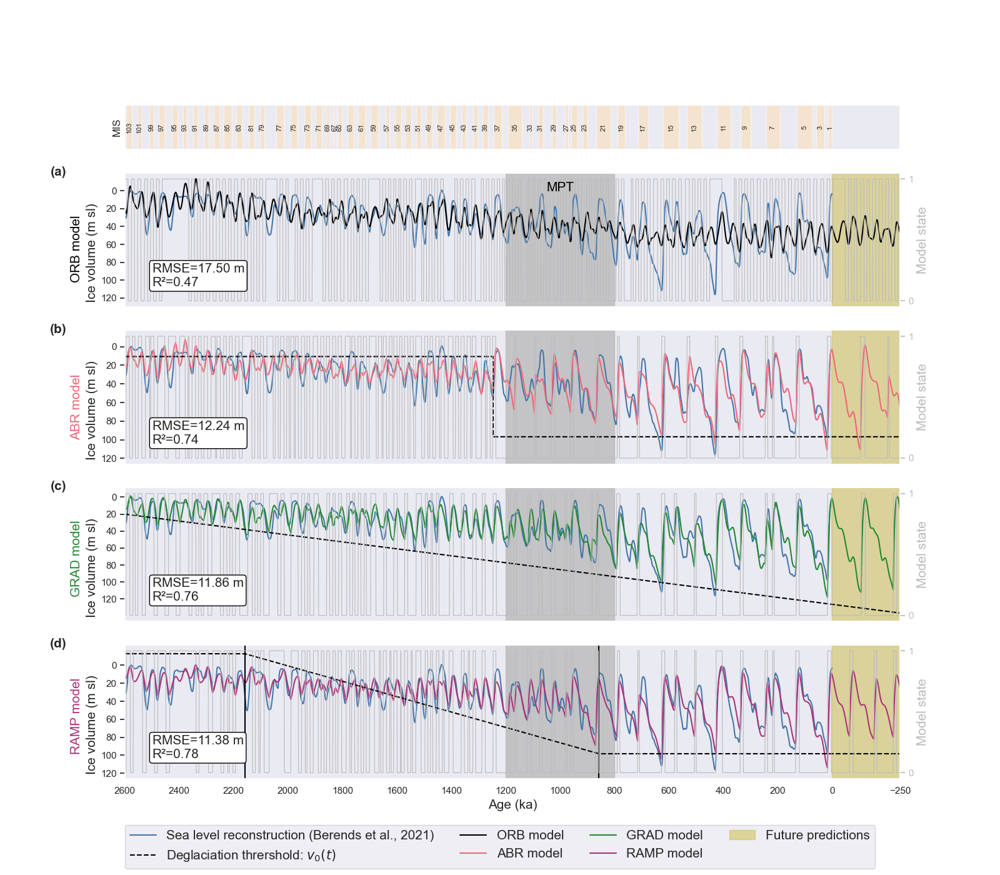

In [8]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2600 and (int(label)%2!=0):
        ax[0].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2600:
            # ax[0].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax[0].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax[0].set_ylim(0, 1)
# ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_ylabel('MIS')

##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
ax[1].plot(ORB_data['time_sea'], ORB_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax[1].plot(ORB_data['time_bounds'], ORB_data['v0s'], linestyle="--" , color=bright.black, label=r"Deglaciation thrershold: $v_0(t)$")
ax[1].plot(ORB_data['time'], ORB_data['icevolume'], color=bright.black, label="ORB model")
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[1].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[1].set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])

ax2 = ax[1].twinx()
ax2.plot(ORB_data['time'], ORB_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_orb:.2f} m\nR²={r2_orb:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[1].set_xlim(-ORB_data['start_year'],-ORB_data['future_time'])
# ax[1].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax[1].set_ylim(-20, 130)

ax[1].invert_yaxis()
# ax[1].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[1].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[1].transAxes, fontsize=font)
ax[1].text(-0.07, 0.2, 'ORB model', color=bright.black, rotation=90, transform=ax[1].transAxes, fontsize=font)

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
ax[2].plot(ABR_data['time_sea'], ABR_data['sea'], linestyle="-" , color=bright.blue)
ax[2].plot(ABR_data['time'], ABR_data['icevolume'], color=bright.red, label="ABR model")
ax[2].plot(ABR_data['time_bounds'], ABR_data['v0s'], linestyle="--" , color=bright.black)
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[2].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[2].set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])

ax2 = ax[2].twinx()
ax2.plot(ABR_data['time'], ABR_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_abr:.2f} m\nR²={r2_abr:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))


ax[2].set_xlim(-ABR_data['start_year'],-ABR_data['future_time'])
ax[2].set_ylim(np.min([np.min(ABR_data['v0s']), np.min(ABR_data['icevolume']), np.min(ABR_data['sea'])])-10,
               np.max([np.max(ABR_data['v0s']), np.max(ABR_data['icevolume']), np.max(ABR_data['sea'])])+10)

ax[2].invert_yaxis()
# ax[2].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[2].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[2].transAxes, fontsize=font)
ax[2].text(-0.07, 0.2, 'ABR model', color=bright.red, rotation=90, transform=ax[2].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
ax[3].plot(GRAD_data['time_sea'], GRAD_data['sea'], linestyle="-" , color=bright.blue)
ax[3].plot(GRAD_data['time'], GRAD_data['icevolume'], color=bright.green, label="GRAD model")
ax[3].plot(GRAD_data['time_bounds'], GRAD_data['v0s'], linestyle="--" , color=bright.black)
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[3].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[3].set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])

ax2 = ax[3].twinx()
ax2.plot(GRAD_data['time'], GRAD_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_grad:.2f} m\nR²={r2_grad:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[3].set_xlim(-GRAD_data['start_year'],-GRAD_data['future_time'])
ax[3].set_ylim(np.min([np.min(GRAD_data['v0s']), np.min(GRAD_data['icevolume']), np.min(GRAD_data['sea'])])-10,
               np.max([np.max(GRAD_data['v0s']), np.max(GRAD_data['icevolume']), np.max(GRAD_data['sea'])])+10)

ax[3].invert_yaxis()
# ax[3].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[3].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[3].transAxes, fontsize=font)
ax[3].text(-0.07, 0.2, 'GRAD model', color=bright.green, rotation=90, transform=ax[3].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
ax[4].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax[4].plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.purple, label="RAMP model")
ax[4].plot(RAMP_data['time_bounds'], RAMP_data['v0s'], linestyle="--" , color=bright.black)
# ax[4].vlines(x=RAMP_data['t2'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax[4].vlines(x=RAMP_data['t2'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color=bright.black)
ax[4].vlines(x=RAMP_data['t1'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color=bright.black)

# ax[4].vlines(x=RAMP_data['t1'], ymin=np.min([np.min(RAMP_data['icplt.txt in middle of vspaceevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax[4].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[4].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax[4].set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])

ax2 = ax[4].twinx()
ax2.plot(RAMP_data['time'], RAMP_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp:.2f} m\nR²={r2_ramp:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[4].set_xlim(-RAMP_data['start_year'],-RAMP_data['future_time'])
ax[4].set_ylim(np.min([np.min(RAMP_data['v0s']), np.min(RAMP_data['icevolume']), np.min(RAMP_data['sea'])])-10,
               np.max([np.max(RAMP_data['v0s']), np.max(RAMP_data['icevolume']), np.max(RAMP_data['sea'])])+10)


ax[4].invert_yaxis()
# ax[4].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax[4].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax[4].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[4].transAxes, fontsize=font)
ax[4].text(-0.07, 0.2, 'RAMP model', color=bright.purple, rotation=90, transform=ax[4].transAxes, fontsize=font)


ax2.set_ylabel('Model state', fontsize=font)

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[4].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax[4].set_xlabel("Age (ka)", fontsize=font)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)
# ax[4].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i in range(4):
    ax[i+1].text(-0.075, 1.05, panel_label[i], transform=ax[i+1].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i+1].set_yticks([0,20,40,60,80,100,120])

fig.legend(ncol=4, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f02.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 3. Figure 3 - Lomb Scargle Periodogram

In [9]:
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)

# scipy periodogram
f_ice_pre_split = RAMP_data['f_ice_pre_split']
Power_ice_pre_split = RAMP_data['Power_ice_pre_split']
f_sea_pre_split = RAMP_data['f_sea_pre_split']
Power_sea_pre_split = RAMP_data['Power_sea_pre_split']
f_ice_post_split = RAMP_data['f_ice_post_split']
Power_ice_post_split = RAMP_data['Power_ice_post_split']
f_sea_post_split = RAMP_data['f_sea_post_split']
Power_sea_post_split = RAMP_data['Power_sea_post_split']

# LambScargle periodogram
time_sea_pre_split = RAMP_data['time_sea_pre_split'] 
time_sea_post_split = RAMP_data['time_sea_post_split']
f_sea_LombScargle_pre_split = RAMP_data['f_sea_LombScargle_pre_split']
P_sea_LombScargle_pre_split = RAMP_data['P_sea_LombScargle_pre_split']
f_sea_LombScargle_post_split = RAMP_data['f_sea_LombScargle_post_split']
P_sea_LombScargle_post_split = RAMP_data['P_sea_LombScargle_post_split']
f_ice_LombScargle_pre_split = RAMP_data['f_ice_LombScargle_pre_split']
P_ice_LombScargle_pre_split = RAMP_data['P_ice_LombScargle_pre_split']
f_ice_LombScargle_post_split = RAMP_data['f_ice_LombScargle_post_split']
P_ice_LombScargle_post_split = RAMP_data['P_ice_LombScargle_post_split']

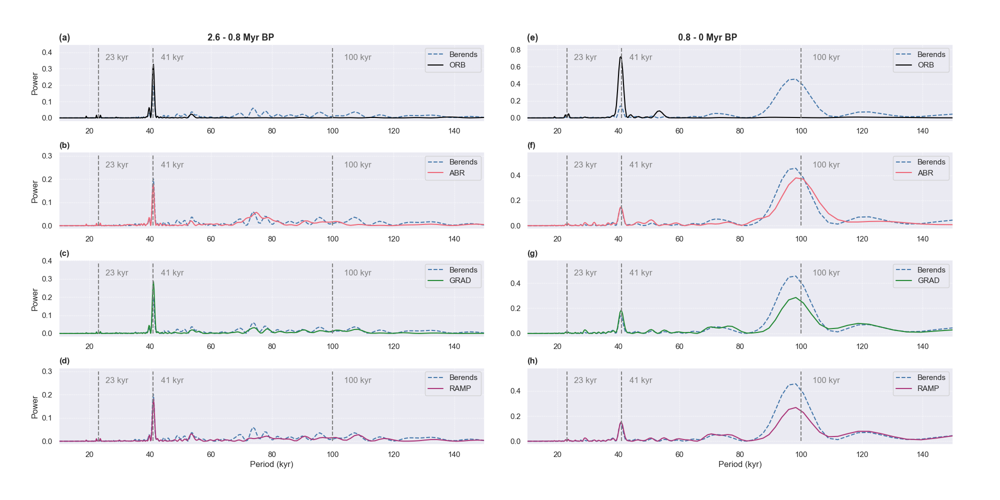

In [10]:
# Function to plot one periodogram
def plot_periodogram(ax, data, name, font, title=False, xlabel=False, color=bright.purple):
    # get data
    time_sea_pre_split = data['time_sea_pre_split'] 
    time_sea_post_split = data['time_sea_post_split']
    f_sea_LombScargle_pre_split = data['f_sea_LombScargle_pre_split']
    P_sea_LombScargle_pre_split = data['P_sea_LombScargle_pre_split']
    f_sea_LombScargle_post_split = data['f_sea_LombScargle_post_split']
    P_sea_LombScargle_post_split = data['P_sea_LombScargle_post_split']
    f_ice_LombScargle_pre_split = data['f_ice_LombScargle_pre_split']
    P_ice_LombScargle_pre_split = data['P_ice_LombScargle_pre_split']
    f_ice_LombScargle_post_split = data['f_ice_LombScargle_post_split']
    P_ice_LombScargle_post_split = data['P_ice_LombScargle_post_split']


    ax[0].plot(1/f_sea_LombScargle_pre_split, P_sea_LombScargle_pre_split, linestyle='--', color=bright.blue, label="Berends")
    ax[0].plot(1/f_ice_LombScargle_pre_split, P_ice_LombScargle_pre_split, color=color, label=name)
    # mark obliquity and precession cycles + 100 kyr
    ax[0].vlines([100, 41, 23], 0, np.max([np.max(P_sea_LombScargle_pre_split), np.max(P_ice_LombScargle_pre_split)])+0.1, color='grey', linestyle='--')
    # ax[0].set_ylim(0,np.max([np.max(Power_sea_pre_split), np.max(Power_ice_pre_split)])+0.1)
    ax[0].set_xlim(10,150)
    
    ax[1].plot(1/f_sea_LombScargle_post_split, P_sea_LombScargle_post_split, linestyle='--', color=bright.blue, label='Berends')
    ax[1].plot(1/f_ice_LombScargle_post_split, P_ice_LombScargle_post_split, color=color, label=name)
    # mark obliquity and precession cycles + 100 kyr
    ax[1].vlines([100, 41, 23], 0, np.max([np.max(P_sea_LombScargle_post_split), np.max(P_ice_LombScargle_post_split)])+0.1, color='grey', linestyle='--')
    # ax[1].set_ylim(0,np.max([np.max(P_sea_LombScargle_post_split), np.max(P_ice_LombScargle_post_split)])+0.1)
    ax[1].set_xlim(10,150)
    
    
    ax[0].set_ylabel("Power")
    # ax[1].set_ylabel("Normalized Power", weight='bold')
    if xlabel:
        ax[0].set_xlabel("Period (kyr)")
        ax[1].set_xlabel("Period (kyr)")
    # Add a common y-axis label
    # fig.text(0.045, 0.5, r"Normalized Power", weight='bold', va='center', rotation='vertical')
    
    for i in range(2):
        ax[i].text(0.67, 0.8, '100 kyr', color='grey', rotation=0, transform=ax[i].transAxes)
        ax[i].text(0.24, 0.8, '41 kyr', color='grey', rotation=0, transform=ax[i].transAxes)
        ax[i].text(0.11, 0.8, '23 kyr', color='grey', rotation=0, transform=ax[i].transAxes)
        ax[i].grid(True, which='both', linestyle='--', linewidth=0.5)
        
    if title==True:
        title_0 = f"{-data['start_year']*1e-3:.1f} - {data['time'][data['pre_split']]*1e-3:.1f} Myr BP"
        title_1 = f"{data['time'][data['pre_split']]*1e-3:.1f} - 0 Myr BP"
        ax[0].set_title(f"(a) {title_0:^125}", fontsize=font-2, fontweight='bold', loc='left')
        ax[1].set_title(f"(e) {title_1:^125}", fontsize=font-2, fontweight='bold', loc='left')
    else:
        ax[0].set_title(title[0], fontweight='bold', loc='left')
        ax[1].set_title(title[1], fontweight='bold', loc='left')
    
    # # Add panel label 
    # panel_label =['a)', 'b)']
    # for i in range(2):
    #     ax[i].text(-0.075, 1.05, panel_label[i], transform=ax[i].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    
    # if title!=None:
    #     plt.title(title, fontsize=25)
    
    # Adjust the spacing between subplots
    # fig.subplots_adjust(hspace=0.5)  # Reduce this value to bring subplots closer
    # fig.legend(ncol=2, loc=8, fontsize=font)
    ax[0].legend()
    ax[1].legend()

# Create a 2x2 subplot layout
fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(20, 10))
fig.tight_layout(pad=5.0)
font = 15

plot_periodogram(ax=[axs[0,0],axs[0,1]], data=ORB_data, name='ORB', font=font, color=bright.black, title=True)
plot_periodogram(ax=[axs[1,0],axs[1,1]], data=ABR_data, name='ABR', font=font, color=bright.red, title=['(b)','(f)'])
plot_periodogram(ax=[axs[2,0],axs[2,1]], data=GRAD_data, name='GRAD', font=font, color=bright.green, title=['(c)','(g)'])
plot_periodogram(ax=[axs[3,0],axs[3,1]], data=RAMP_data, name='RAMP', font=font, color=bright.purple, xlabel=True, title=['(d)','(h)'])


# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.1)
plt.savefig('Plots/f03.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 4. Figure 4 - Bound plot RAMP

In [11]:
# load pickled data sets
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)


In [12]:
mask = []
states = np.where(np.array(RAMP_data['state'])==1, True, False)
        
state_times = RAMP_data['time'][states]
state_times = state_times[state_times>=0]
state_times[-100:]

array([624., 623., 622., 621., 620., 619., 618., 617., 616., 615., 578.,
       577., 576., 575., 574., 573., 572., 571., 505., 504., 503., 502.,
       501., 500., 426., 425., 424., 423., 422., 421., 420., 419., 418.,
       417., 416., 415., 414., 413., 412., 411., 410., 409., 408., 407.,
       406., 405., 404., 337., 336., 335., 334., 333., 332., 331., 330.,
       329., 328., 327., 246., 245., 244., 243., 242., 241., 240., 239.,
       238., 218., 217., 216., 215., 214., 213., 133., 132., 131., 130.,
       129., 128., 127., 126., 125., 124., 123., 122., 121.,  16.,  15.,
        14.,  13.,  12.,  11.,  10.,   9.,   8.,   7.,   6.,   5.,   4.,
         3.])

In [13]:
# Function to find continuous intervals
def find_intervals(time_array):
    intervals = []
    start = time_array[0]

    # step size
    step = RAMP_data['resolution']*1e-3
    
    for i in range(1, len(time_array)):
        if not math.isclose(time_array[i], time_array[i-1]-step):
        # if time_array[i]==time_array[i-1]-1:
            intervals.append((time_array[i-1], start))
            start = time_array[i]
    intervals.append((time_array[-1], start))
    return intervals

# Find glacial intervals
interglacial_intervals = find_intervals(state_times)
interglacial_intervals

[(2581.0, 2595.0),
 (2536.0, 2569.0),
 (2492.0, 2521.0),
 (2450.0, 2479.0),
 (2339.0, 2435.0),
 (2294.0, 2327.0),
 (2248.0, 2277.0),
 (2223.0, 2236.0),
 (2204.0, 2215.0),
 (2132.0, 2193.0),
 (2109.0, 2120.0),
 (2089.0, 2102.0),
 (2015.0, 2069.0),
 (1963.0, 1989.0),
 (1938.0, 1950.0),
 (1920.0, 1930.0),
 (1890.0, 1907.0),
 (1869.0, 1878.0),
 (1848.0, 1858.0),
 (1826.0, 1835.0),
 (1804.0, 1816.0),
 (1774.0, 1786.0),
 (1756.0, 1766.0),
 (1733.0, 1742.0),
 (1714.0, 1722.0),
 (1683.0, 1700.0),
 (1660.0, 1665.0),
 (1639.0, 1650.0),
 (1622.0, 1626.0),
 (1600.0, 1611.0),
 (1585.0, 1586.0),
 (1561.0, 1572.0),
 (1544.0, 1548.0),
 (1512.0, 1530.0),
 (1487.0, 1496.0),
 (1469.0, 1476.0),
 (1446.0, 1455.0),
 (1427.0, 1432.0),
 (1394.0, 1408.0),
 (1353.0, 1363.0),
 (1333.0, 1338.0),
 (1311.0, 1320.0),
 (1276.0, 1287.0),
 (1236.0, 1246.0),
 (1184.0, 1191.0),
 (1160.0, 1168.0),
 (1108.0, 1119.0),
 (1067.0, 1076.0),
 (1022.0, 1030.0),
 (975.0, 980.0),
 (951.0, 959.0),
 (859.0, 869.0),
 (781.0, 789.0),
 

In [14]:
# Calculate Terminations (durations)
terminations = len(interglacial_intervals) + 1
# first glacial (if exist)
Ts = {'T1': interglacial_intervals[-1][0]-0}

for i in range(terminations-2):
    Ts[f'T{i+2}'] = interglacial_intervals[-(i+2)][0] - interglacial_intervals[-(i+1)][1] - 1

# last glacial (if exist)
Ts[f'T{terminations}'] = -RAMP_data['start_year'] - interglacial_intervals[0][1]

Ts

{'T1': 3.0,
 'T2': 104.0,
 'T3': 79.0,
 'T4': 19.0,
 'T5': 80.0,
 'T6': 66.0,
 'T7': 73.0,
 'T8': 65.0,
 'T9': 36.0,
 'T10': 82.0,
 'T11': 66.0,
 'T12': 69.0,
 'T13': 81.0,
 'T14': 15.0,
 'T15': 41.0,
 'T16': 36.0,
 'T17': 31.0,
 'T18': 40.0,
 'T19': 15.0,
 'T20': 44.0,
 'T21': 29.0,
 'T22': 23.0,
 'T23': 12.0,
 'T24': 14.0,
 'T25': 30.0,
 'T26': 18.0,
 'T27': 13.0,
 'T28': 13.0,
 'T29': 10.0,
 'T30': 15.0,
 'T31': 13.0,
 'T32': 12.0,
 'T33': 12.0,
 'T34': 13.0,
 'T35': 10.0,
 'T36': 12.0,
 'T37': 9.0,
 'T38': 17.0,
 'T39': 13.0,
 'T40': 10.0,
 'T41': 13.0,
 'T42': 7.0,
 'T43': 17.0,
 'T44': 9.0,
 'T45': 12.0,
 'T46': 10.0,
 'T47': 11.0,
 'T48': 12.0,
 'T49': 7.0,
 'T50': 12.0,
 'T51': 25.0,
 'T52': 19.0,
 'T53': 6.0,
 'T54': 11.0,
 'T55': 10.0,
 'T56': 7.0,
 'T57': 11.0,
 'T58': 16.0,
 'T59': 11.0,
 'T60': 14.0,
 'T61': 12.0,
 'T62': 14.0,
 'T63': 11.0,
 'T64': 5.0}

In [15]:
glacial_end_idx = []
glacial_ends = []
step = RAMP_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMP_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

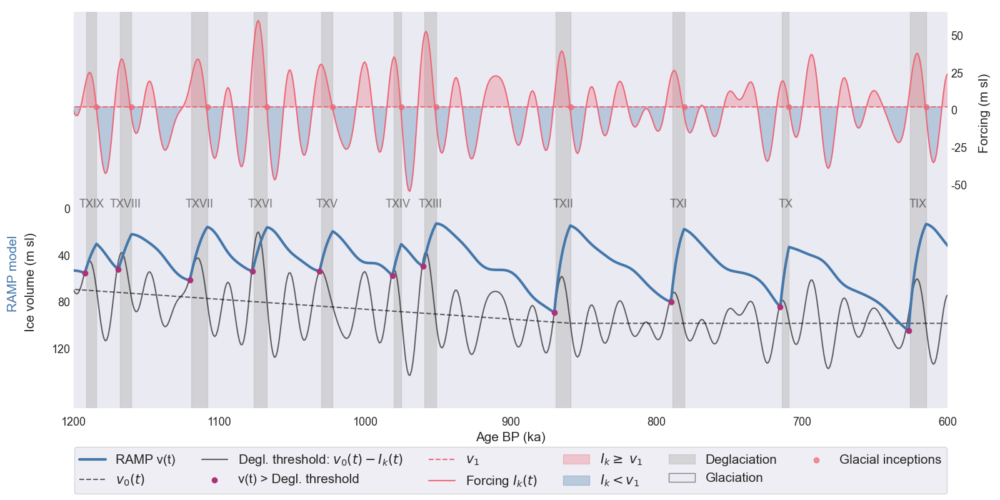

In [16]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax1 = plt.subplots(figsize=(16,8))
fig.tight_layout(pad=7.0)

##############################################################################################################################################
# Plot
##############################################################################################################################################
# plt.plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax1.plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.blue, label="RAMP v(t)", linewidth=3, zorder=9)
ax1.plot(RAMP_data['time_bounds'], RAMP_data['v0s'], color=bright.black, linestyle='--', alpha=0.6, label=r"$v_0(t)$")
ax1.plot(RAMP_data['time_bounds'], RAMP_data['v0_bounds'], color=bright.black, linestyle='-', alpha=0.6, label=r"Degl. threshold: $v_0(t)-I_k(t)$")

# # with markers
# ax1.plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.blue, marker='o', label="RAMP model v(t)", linewidth=3, zorder=9)
# ax1.plot(RAMP_data['time_bounds'], RAMP_data['v0_bounds'], color=bright.black, marker='o', linestyle='-', alpha=0.6, label=f"Deglaciation threshold")
# ax1.plot(RAMP_data['time_bounds'], RAMP_data['v1_bounds'], color=bright.red, marker='o', alpha=1, label="Insolation")
# ax1.axvspan(1200, 800, color=bright.grey, alpha=0.8)

# marks intersection points between v and v_0(t) (manually indentified)
# intersections = [[426,102.2], [337,71.5], [245,79.25], [219,57.1], [131,80.367], [17, 117.5]]
# for i, intersect in enumerate(intersections):
#     if i==len(intersections)-1:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10, label='v(t) > Degl. threshold')
#     else:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10)

# mark intersection points between v and v_0(t)
# at first get indices of end points of glacial states
glacial_end_idx = []
glacial_ends = []
step = RAMP_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMP_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

ax1.scatter(glacial_ends, RAMP_data['icevolume'][glacial_end_idx], color=bright.purple, zorder=10, label='v(t) > Degl. threshold')


ax2 = ax1.twinx()
ax2.axhline(RAMP_data['v1'], -RAMP_data['future_time'], -RAMP_data['start_year'], linestyle='--', color=bright.red, alpha=1, label=r"$v_1$")
ax2.plot(RAMP_data['time_bounds'], RAMP_data['v1_bounds'], color=bright.red, alpha=1, label=r"Forcing $I_k(t)$")

# shade the area where insolation>=v1
ax2.fill_between(x=RAMP_data['time_bounds'], y1=RAMP_data['v1_bounds'], y2=RAMP_data['v1'], where=(RAMP_data['v1_bounds'] >= RAMP_data['v1']), color=bright.red, alpha=0.3, label=r'$I_k\geq$ $v_1$')

# shade the area where insolation<v1
ax2.fill_between(x=RAMP_data['time_bounds'], y1=RAMP_data['v1_bounds'], y2=RAMP_data['v1'], where=(RAMP_data['v1_bounds'] < RAMP_data['v1']), color=bright.blue, alpha=0.3, label=r'$ I_k< v_1$')


# mark position at end of interglacial for v1 
for i, interglacial_end in enumerate(np.array(interglacial_intervals)[:,0]):
    if i==0:
        ax2.scatter(interglacial_end, RAMP_data['v1'], color=bright.red, alpha=0.7, zorder=10, label='Glacial inceptions')    
    ax2.scatter(interglacial_end, RAMP_data['v1'], color=bright.red, alpha=0.7, zorder=10)

# Shade interglacial intervals
terminations = [
    "I", "II", "III", "IV", "V", "VI", "VII", "VIII", "IX", "X",
    "XI", "XII", "XIII", "XIV", "XV", "XVI", "XVII", "XVIII", "XIX", "XX",
    "XXI", "XXII", "XXIII", "XXIV", "XXV"]
for i, interval in enumerate(interglacial_intervals[::-1]):
    if i==0:
        ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5, label='Deglaciation')
    ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5)
    if i>7 and i<19:
        plt.text((interval[1]+interval[0])/2, -65, f'T{terminations[i]}', rotation=0, horizontalalignment='center', alpha=0.6, fontsize=font-2)


ax1.invert_yaxis()
ax1.invert_xaxis()

# ax1.set_yticks(ticks=[-170, 0, 20, 40, 60, 80, 100, 120], labels=['', '0', '20', '40', '60', '80', '100', '120'], fontsize=font)
ax1.set_yticks(ticks=[-170, 0, 40, 80, 120], labels=['', '0', '40', '80', '120'], fontsize=font-2)
ax2.set_yticks(ticks=[-200, -50, -25, 0, 25, 50], labels=['', '-50', '-25', '0', '25', '50'], fontsize=font-2)
ax1.yaxis.set_tick_params(length=0,labelbottom=True)
ax2.yaxis.set_tick_params(length=0,labelbottom=False)

ax1.text(-0.055, 0.20, 'Ice volume (m sl)', rotation=90, transform=ax1.transAxes, fontsize=font)
ax1.text(-0.075, 0.25, 'RAMP model', color=bright.blue, rotation=90, transform=ax1.transAxes, fontsize=font)
ax2.text(1.035, 0.65, 'Forcing (m sl)', rotation=90, transform=ax2.transAxes, fontsize=font)
# ax2.set_ylabel('Forcing (m sl)', fontsize=font)


##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################


# plt.xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax1.set_xlabel("Age BP (ka)", fontsize=font)
ax1.set_xticks(ticks=np.arange(1200, 599, -100), labels=['1200', '1100', '1000', '900', '800', '700', '600'], fontsize=font-2)
plt.xlim(1200,600)


# Add label for glaciation state
glacial_label = mpatches.Patch(facecolor=plt.gca().get_facecolor(), edgecolor='grey', label='Glaciation')

# Get the current handles and labels, add glacial_label
handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
handles = np.hstack([handles_ax1, handles_ax2, glacial_label])
labels = np.hstack([labels_ax1, labels_ax2, 'Glaciation'])

# change position in legend, s.t. 'Deglaciation' and 'Glaciation' are adjacent -> looks nicer
def change_pos(in_arr, pick_idx, put_idx ):  
    new_arr = in_arr.copy()
    range_arr = np.arange(in_arr.size)  
    tmp = in_arr[pick_idx]
    new_arr[range_arr != put_idx ] = in_arr[range_arr != pick_idx]
    new_arr[put_idx] = tmp
    return new_arr

handles = change_pos(handles, 4, 9)
labels = change_pos(labels, 4, 9)
handles = list(change_pos(handles, 8, 10))
labels = list(change_pos(labels, 8, 10))


# handles.append(glacial_label)
# labels.append('Glaciation')
plt.legend(handles=handles, labels=labels, ncol=6, bbox_to_anchor=(0.5, -0.08), loc='upper center', fontsize=font)

# fig.legend(ncol=5, loc=8, fontsize=font)
plt.tight_layout()
# fig.subplots_adjust(bottom=0.2)  
if title!=None:
    plt.title(title, fontsize=15)
plt.savefig('Plots/f04.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 5. Figure 5 - RAMP-l Plot and Periodograms

In [17]:
# load pickled data sets
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP5_data = pickle.load(file)

rmse_ramp5 = RAMP5_data['rmse']
print(f'RMSE(RAMP5)={rmse_ramp5}')

# load pickled data sets
with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)

rmse_ramp_l = RAMPl_data['rmse']
R2_ramp_l = r2_score(y_pred=RAMPl_data['icevolume'][:len(RAMPl_data['sea'])], y_true=RAMPl_data['sea'])
print(rmse_ramp_l, R2_ramp_l)

RMSE(RAMP5)=11.384268967313442
10.022636700269848 0.826520606591107


In [18]:
# Analysis of RAMP-l model
t2 = RAMPl_data['t2']
t1 = RAMPl_data['t1']
print(f't2={t2:.1f} kyr')
print(f't1={t1:.1f} kyr')

v0_prime = RAMPl_data['v0_prime']
v0 = RAMPl_data['v0']
taud_prime = RAMPl_data['taud0_prime']
taud = RAMPl_data['taud0'] 
print(f'v0_prime={v0_prime:.1f} m')
print(f'v0={v0:.1f} m')
print(f'taud_prime={taud_prime:.1f} kyr')
print(f'taud={taud:.1f} kyr')

icevolume = RAMPl_data['icevolume']
time = RAMPl_data['time']
time_sea = RAMPl_data['time_sea']
v_mean_first_1Myr = np.mean(icevolume[:1000])
v_min_first_1Myr = np.min(icevolume[:1000])
v_max_first_1Myr = np.max(icevolume[:1000])
v_mean_last_1Myr = np.mean(icevolume[1600:len(time_sea)])
v_min_last_1Myr = np.min(icevolume[1600:len(time_sea)])
v_max_last_1Myr = np.max(icevolume[1600:len(time_sea)])

print(f'First 1 Myr: vmin={v_min_first_1Myr:.1f}m, vmax={v_max_first_1Myr:.1f}m, vmean={v_mean_first_1Myr:.1f}m')
print(f'Last 1 Myr: vmin={v_min_last_1Myr:.1f}m, vmax={v_max_last_1Myr:.1f}m, vmean={v_mean_last_1Myr:.1f}m')
print(f'Mean v over whole Pleistocene: {np.mean(icevolume[:len(time_sea)]):.1f}')

v_future = icevolume[2601:]
v_min_future = np.min(v_future)
v_max_future = np.max(v_future)
v_mean_future = np.mean(v_future)
print(f'Future: vmin={v_min_future:.1f}m, vmax={v_max_future:.1f}m, vmean={v_mean_future:.1f}m')

t2=1977.8 kyr
t1=454.3 kyr
v0_prime=20.7 m
v0=127.4 m
taud_prime=41.2 kyr
taud=5.3 kyr
First 1 Myr: vmin=-3.4m, vmax=47.5m, vmean=19.8m
Last 1 Myr: vmin=-0.3m, vmax=110.8m, vmean=47.9m
Mean v over whole Pleistocene: 33.3
Future: vmin=-1.2m, vmax=116.8m, vmean=47.8m


In [19]:
mask = []
states = np.where(np.array(RAMP_data['state'])==1, True, False)
        
state_times = RAMP_data['time'][states]
state_times = state_times[state_times>=0]
state_times[-100:]

array([624., 623., 622., 621., 620., 619., 618., 617., 616., 615., 578.,
       577., 576., 575., 574., 573., 572., 571., 505., 504., 503., 502.,
       501., 500., 426., 425., 424., 423., 422., 421., 420., 419., 418.,
       417., 416., 415., 414., 413., 412., 411., 410., 409., 408., 407.,
       406., 405., 404., 337., 336., 335., 334., 333., 332., 331., 330.,
       329., 328., 327., 246., 245., 244., 243., 242., 241., 240., 239.,
       238., 218., 217., 216., 215., 214., 213., 133., 132., 131., 130.,
       129., 128., 127., 126., 125., 124., 123., 122., 121.,  16.,  15.,
        14.,  13.,  12.,  11.,  10.,   9.,   8.,   7.,   6.,   5.,   4.,
         3.])

In [20]:
# Function to find continuous intervals
def find_intervals(time_array):
    intervals = []
    start = time_array[0]

    # step size
    step = RAMP_data['resolution']*1e-3
    
    for i in range(1, len(time_array)):
        if not math.isclose(time_array[i], time_array[i-1]-step):
        # if time_array[i]==time_array[i-1]-1:
            intervals.append((time_array[i-1], start))
            start = time_array[i]
    intervals.append((time_array[-1], start))
    return intervals

# Find glacial intervals
interglacial_intervals = find_intervals(state_times)
interglacial_intervals

[(2581.0, 2595.0),
 (2536.0, 2569.0),
 (2492.0, 2521.0),
 (2450.0, 2479.0),
 (2339.0, 2435.0),
 (2294.0, 2327.0),
 (2248.0, 2277.0),
 (2223.0, 2236.0),
 (2204.0, 2215.0),
 (2132.0, 2193.0),
 (2109.0, 2120.0),
 (2089.0, 2102.0),
 (2015.0, 2069.0),
 (1963.0, 1989.0),
 (1938.0, 1950.0),
 (1920.0, 1930.0),
 (1890.0, 1907.0),
 (1869.0, 1878.0),
 (1848.0, 1858.0),
 (1826.0, 1835.0),
 (1804.0, 1816.0),
 (1774.0, 1786.0),
 (1756.0, 1766.0),
 (1733.0, 1742.0),
 (1714.0, 1722.0),
 (1683.0, 1700.0),
 (1660.0, 1665.0),
 (1639.0, 1650.0),
 (1622.0, 1626.0),
 (1600.0, 1611.0),
 (1585.0, 1586.0),
 (1561.0, 1572.0),
 (1544.0, 1548.0),
 (1512.0, 1530.0),
 (1487.0, 1496.0),
 (1469.0, 1476.0),
 (1446.0, 1455.0),
 (1427.0, 1432.0),
 (1394.0, 1408.0),
 (1353.0, 1363.0),
 (1333.0, 1338.0),
 (1311.0, 1320.0),
 (1276.0, 1287.0),
 (1236.0, 1246.0),
 (1184.0, 1191.0),
 (1160.0, 1168.0),
 (1108.0, 1119.0),
 (1067.0, 1076.0),
 (1022.0, 1030.0),
 (975.0, 980.0),
 (951.0, 959.0),
 (859.0, 869.0),
 (781.0, 789.0),
 

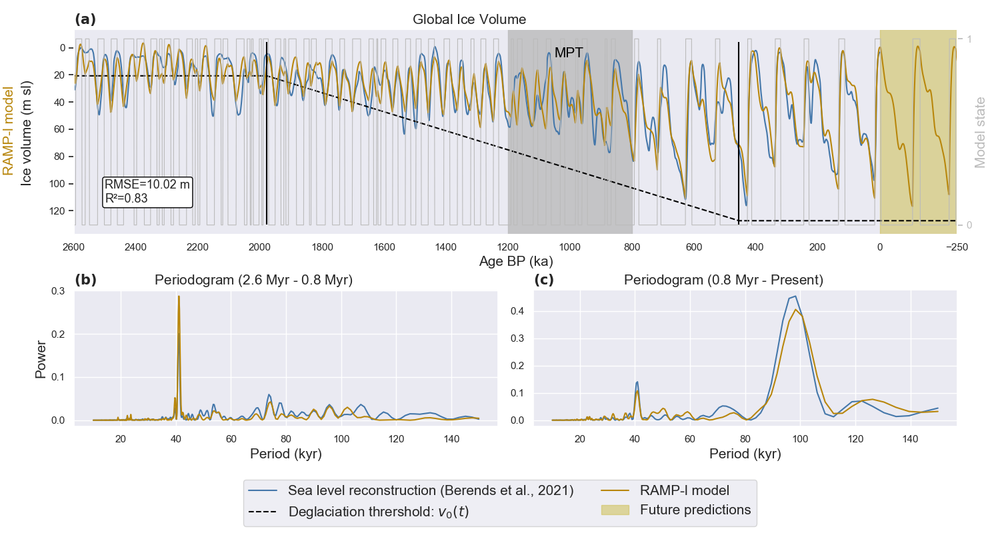

In [21]:
plt.close('all')

threshold = 285
c = 'darkgoldenrod'

fig, ax = plt.subplot_mosaic('AA;BC', figsize=(15,8), height_ratios=[3, 2])

####################################
# PLOT OF ICEVOLUME
####################################
ax['A'].plot(RAMPl_data['time_sea'], RAMPl_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax['A'].plot(RAMPl_data['time_bounds'], RAMPl_data['v0s'], linestyle="--" , color=bright.black, label=r"Deglaciation thrershold: $v_0(t)$")
ax['A'].plot(RAMPl_data['time'], RAMPl_data['icevolume'], color=c, label="RAMP-l model")
# ax['A'].vlines(x=RAMPl_data['t2'], ymin=np.min([np.min(RAMPl_data['icevolume']-10),np.min(RAMPl_data['v0s'])-10]), ymax=np.max([np.max(RAMPl_data['icevolume']+10),RAMPl_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax['A'].vlines(x=RAMPl_data['t2'], ymin=RAMPl_data['v0s'].min()-25, ymax=130, linestyle='-', color=bright.black)
ax['A'].vlines(x=RAMPl_data['t1'], ymin=RAMPl_data['v0s'].min()-25, ymax=130, linestyle='-', color=bright.black)

# ax['A'].vlines(x=RAMPl_data['t1'], ymin=np.min([np.min(RAMPl_data['icevolume']-10),np.min(RAMPl_data['v0s'])-10]), ymax=np.max([np.max(RAMPl_data['icevolume']+10),RAMPl_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax['A'].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax['A'].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax['A'].set_yticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])

ax2 = ax['A'].twinx()
ax2.plot(RAMPl_data['time'], RAMPl_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp_l:.2f} m\nR²={R2_ramp_l:.2f}", fontsize=font-2, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax['A'].set_xlim(-RAMPl_data['start_year'],-RAMPl_data['future_time'])
ax['A'].set_ylim(np.min([np.min(RAMPl_data['v0s']), np.min(RAMPl_data['icevolume']), np.min(RAMPl_data['sea'])])-10,
               np.max([np.max(RAMPl_data['v0s']), np.max(RAMPl_data['icevolume']), np.max(RAMPl_data['sea'])])+10)


ax['A'].invert_yaxis()
# ax['A'].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax['A'].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax['A'].text(-0.06, 0.25, 'Ice volume (m sl)', rotation=90, transform=ax['A'].transAxes, fontsize=font)
ax['A'].text(-0.08, 0.3, 'RAMP-l model', color=c, rotation=90, transform=ax['A'].transAxes, fontsize=font)


ax2.set_ylabel('Model state', fontsize=font)

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax['A'].set_yticks(np.arange(0,121, 20))
ax['A'].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax['A'].set_xlabel("Age BP (ka)", fontsize=font)

ax['A'].set_title(rf"$\bf{{(a)}}$ {'Global Ice Volume':^180}", loc="left", fontsize=font)
ax['A'].grid(False)

####################################
# PLOT OF PERIODOGRAM (Pre MPT)
####################################
# Periodograms for periods [2.6Myr - 0.8Myr BP]
f_sea_preMPT, P_sea_preMPT = LombScargle(RAMPl_data['time_sea'][:1801], RAMPl_data['sea'][:1801], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
f_model_preMPT, P_model_preMPT = LombScargle(RAMPl_data['time'][:1801], RAMPl_data['icevolume'][:1801], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)

ax['B'].plot(1/f_sea_preMPT, P_sea_preMPT, color=bright.blue)
ax['B'].plot(1/f_model_preMPT, P_model_preMPT, color=c)
# mark obliquity and precession cycles + 100 kyr
# ax['B'].vlines([100, 41, 23.7, 22.4, 19], 0, np.max([P_model, P_ISI])+0.1, color='grey', linestyle='--')


ax['B'].set_xlabel("Period (kyr)", fontsize=font)  # , weight='bold'
ax['B'].set_ylabel("Power", fontsize=font)  
# ax['B'].set_ylim(0, 0.4)
ax['B'].set_yticks([0, 0.1, 0.2, 0.3])

# ax['B'].text(105, 0.2, '100 kyr', color='grey')
# ax['B'].text(43, 0.5, '41 kyr', color='grey', rotation=90, fontsize=10)
# ax['B'].text(24, 0.12, '23.7 kyr', color='grey', rotation=90, fontsize=10)
# ax['B'].text(20.5, 0.1, '22.4 kyr', color='grey', rotation=90, fontsize=10)
# ax['B'].text(17, 0.1, '19 kyr', color='grey', rotation=90, fontsize=10)

# ax['B'].set_xlim(10,120)
ax['B'].set_title(rf"$\bf{{(b)}}$ {'Periodogram (2.6 Myr - 0.8 Myr)':^60}", loc="left", fontsize=font)
ax['B'].grid(True)


####################################
# PLOT OF PERIODOGRAM (Post MPT)
####################################
# Periodograms for periods [0.8Myr - 0 BP]
f_sea_postMPT, P_sea_postMPT = LombScargle(RAMPl_data['time_sea'][1801:len(RAMPl_data['sea'])], RAMPl_data['sea'][1801:len(RAMPl_data['sea'])], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
f_model_postMPT, P_model_postMPT = LombScargle(RAMPl_data['time'][1801:len(RAMPl_data['sea'])], RAMPl_data['icevolume'][1801:len(RAMPl_data['sea'])], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)

ax['C'].plot(1/f_sea_postMPT, P_sea_postMPT, color=bright.blue)
ax['C'].plot(1/f_model_postMPT, P_model_postMPT, color=c)
# mark obliquity and precession cycles + 100 kyr
# ax['C'].vlines([100, 41, 23.7, 22.4, 19], 0, np.max([P_model, P_ISI])+0.1, color='grey', linestyle='--')


ax['C'].set_xlabel("Period (kyr)", fontsize=font)  # , weight='bold'
# ax['C'].set_ylabel("Power")  
# ax['C'].set_ylim(0, 0.5)
ax['C'].set_yticks([0, 0.1, 0.2, 0.3, 0.4])

# ax['C'].text(105, 0.2, '100 kyr', color='grey')
# ax['C'].text(43, 0.5, '41 kyr', color='grey', rotation=90, fontsize=10)
# ax['C'].text(24, 0.12, '23.7 kyr', color='grey', rotation=90, fontsize=10)
# ax['C'].text(20.5, 0.1, '22.4 kyr', color='grey', rotation=90, fontsize=10)
# ax['C'].text(17, 0.1, '19 kyr', color='grey', rotation=90, fontsize=10)

# ax['C'].set_xlim(10,120)
ax['C'].set_title(rf"$\bf{{(c)}}$ {'Periodogram (0.8 Myr - Present)':^65}", loc="left", fontsize=font)
ax['C'].grid(True)


###########################################################
###########################################################

fig.legend(loc=8, ncols=2, fontsize=font)
plt.tight_layout()
fig.subplots_adjust(bottom=0.2)  # Increase the bottom margin to make space for the legend
plt.savefig('Plots/f05.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 6. Figure 6 - RAMP-l model Insolation

In [22]:
# load pickled data sets
with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)

In [23]:
params = RAMPl_data['params']
time = RAMPl_data['time']
Esi = np.array(RAMPl_data['Esi'][::2])
Eco = np.array(RAMPl_data['Eco'][::2])
EnO = np.array(RAMPl_data['EnO'][::2])
esinomega = np.array(RAMPl_data['esinomega'])
ecosomega = np.array(RAMPl_data['ecosomega'])
O = np.array(RAMPl_data['O'])
icevolume = RAMPl_data['icevolume']

insolation_alpha = params['aEsi']*Esi + params['aEco']*Eco + params['aO']*EnO

insolation_k = params['kEsi']*Esi + params['kEco']*Eco + params['kO']*EnO

insolation_l = [params['lEsi']*icevolume[i]*Esi[i] + params['lEco']*icevolume[i]*Eco[i] + params['lO']*icevolume[i]*EnO[i] for i in range(len(icevolume))]

insolation_threshold = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i] + (params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

In [24]:
def normalise(sample):
    m = np.mean(sample)
    std = np.std(sample)
    if std==0:
        norm = (sample-m)
    else:
        norm = (sample-m)/std
    return norm


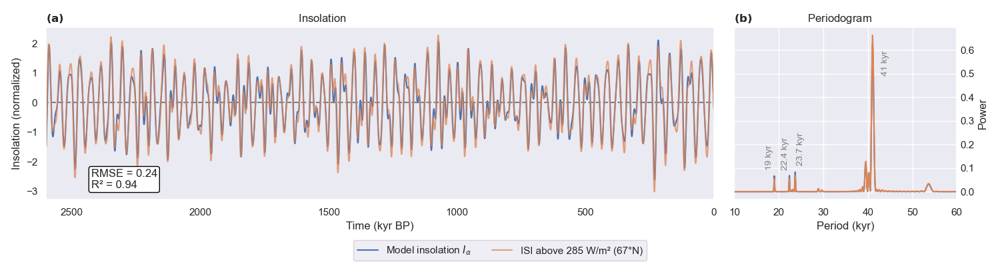

In [25]:
plt.close('all')

threshold = 285

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,4), gridspec_kw={'width_ratios': [3, 1]})

####################################
# PLOT OF INSOLATION
####################################
# load date
data = np.loadtxt('Data/ISI_above_285W_per_m2_lat_67.txt', usecols=[0,threshold+1])
age = data[:,0]
ins = data[:,1]
ins_norm = normalise(ins)

# create plot
ax[0].plot(time, insolation_alpha, label=r'Model insolation $I_\alpha$', alpha=1)
# plt.plot(time, insolation_threshold_norm, label=r'Model Insolation', alpha=1)

# calculate statistics
rmse = root_mean_squared_error(insolation_alpha[:len(ins_norm)], ins_norm)
# rmses[i] = root_mean_squared_error(insolation_threshold_norm, ins_norm)
R2 = r2_score(y_pred=insolation_alpha[:len(ins_norm)], y_true=ins_norm)
        
# plot ISI
ax[0].axhline(xmin=time.min(), xmax=time.max(), y=0, color='grey', linestyle='--')
ax[0].plot(age, ins_norm, label=f'ISI above {threshold} W/m² (67°N)', alpha=0.75)
ax[0].text(x=2425, y=-2.9, s=f"RMSE = {rmse:.2f}\nR² = {R2:.2f}", bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[0].set_xlabel('Time (kyr BP)')
ax[0].set_ylabel('Insolation (normalized)')      
ax[0].set_xlim(0, time.max())

ax[0].invert_xaxis()
ax[0].set_title(rf"$\bf{{(a)}}$ {'Insolation':^160}", loc="left")

####################################
# PLOT OF PERIODOGRAM
####################################
f_model, P_model = LombScargle(time[:len(ins_norm)], insolation_alpha[:len(ins_norm)], normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
f_ISI, P_ISI = LombScargle(age, ins_norm, normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)

ax[1].plot(1/f_model, P_model)
ax[1].plot(1/f_ISI, P_ISI)
# mark obliquity and precession cycles + 100 kyr
# ax[1].vlines([100, 41, 23.7, 22.4, 19], 0, np.max([P_model, P_ISI])+0.1, color='grey', linestyle='--')


ax[1].set_xlabel("Period (kyr)")  # , weight='bold'
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
# Remove tick marks (dashes) on the y-axis
ax[1].tick_params(axis='y', which='both', length=0)
ax[1].set_ylabel("Power")  

# ax[1].text(105, 0.2, '100 kyr', color='grey')
ax[1].text(43, 0.5, '41 kyr', color='grey', rotation=90, fontsize=10)
ax[1].text(24, 0.12, '23.7 kyr', color='grey', rotation=90, fontsize=10)
ax[1].text(20.5, 0.1, '22.4 kyr', color='grey', rotation=90, fontsize=10)
ax[1].text(17, 0.1, '19 kyr', color='grey', rotation=90, fontsize=10)

ax[1].set_xlim(10,60)
ax[1].set_title(rf"$\bf{{(b)}}$ {'Periodogram':^45}", loc="left")
ax[1].grid(True)



fig.legend(loc=8, ncols=2)
plt.tight_layout()
fig.subplots_adjust(bottom=0.25)  # Increase the bottom margin to make space for the legend
plt.savefig('Plots/f06.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 7. Figure 7 - RAMP-l decisive state changes

In [26]:
# load pickled data sets
with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)

c = 'darkgoldenrod'

params = RAMPl_data['params']
time = RAMPl_data['time']
Esi = np.array(RAMPl_data['Esi'][::2])
Eco = np.array(RAMPl_data['Eco'][::2])
EnO = np.array(RAMPl_data['EnO'][::2])
esinomega = np.array(RAMPl_data['esinomega'])
ecosomega = np.array(RAMPl_data['ecosomega'])
O = np.array(RAMPl_data['O'])
icevolume = RAMPl_data['icevolume']

# calculate insolation values
insolation_alpha = params['aEsi']*Esi + params['aEco']*Eco + params['aO']*EnO

insolation_k = params['kEsi']*Esi + params['kEco']*Eco + params['kO']*EnO

insolation_l = [params['lEsi']*icevolume[i]*Esi[i] + params['lEco']*icevolume[i]*Eco[i] + params['lO']*icevolume[i]*EnO[i] for i in range(len(icevolume))]

insolation_threshold = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i] + (params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

# model values
icevolume = RAMPl_data['icevolume']
states = RAMPl_data['state']
time = RAMPl_data['time']
v1_bounds = RAMPl_data['v1_bounds']
v0_bounds = RAMPl_data['v0_bounds']
v1 = RAMPl_data['v1']
v0 = RAMPl_data['v0']

print(f'SHAPES - v1_bounds: {v1_bounds.shape}, icevolume: {icevolume.shape}, states: {np.shape(states)}')

SHAPES - v1_bounds: (2851,), icevolume: (2851,), states: (2851,)


In [27]:
# Find change points
change_indices = np.where(np.diff(states) != 0)[0]

print(change_indices) 

[   5   25   36   49   76   97  119  139  160  193  202  226  247  267
  275  284  291  312  321  339  363  382  391  399  406  428  453  474
  480  496  523  549  558  568  572  578  597  605  610  627  649  667
  677  683  692  717  741  759  765  782  811  833  857  873  898  925
  951  966  976  980  990 1006 1028 1045 1069 1086 1103 1120 1143 1163
 1193 1212 1237 1253 1280 1291 1312 1329 1353 1370 1410 1418 1430 1446
 1482 1496 1523 1539 1569 1583 1618 1626 1639 1656 1713 1720 1733 1747
 1808 1822 1882 1893 1973 1993 2069 2084 2173 2186 2262 2280 2355 2371
 2467 2487 2584 2603 2706 2730 2824 2845]


In [28]:
info = []
for idx in change_indices:
    cond1_idx_before = (icevolume[idx-1]>v0_bounds[idx-1])
    cond1_idx = (icevolume[idx]>v0_bounds[idx])
    cond1_idx_after = (icevolume[idx+1]>v0_bounds[idx+1])

    cond2_idx_before = (v1_bounds[idx-1]>=v1)
    cond2_idx = (v1_bounds[idx]>=v1)
    cond2_idx_after = (v1_bounds[idx+1]>=v1)
    
    data = [states[idx-1], states[idx], states[idx+1], cond1_idx_before, cond1_idx, cond1_idx_after, cond2_idx_before, cond2_idx, cond2_idx_after]
    info.append(data)
info = np.array(info)

In [29]:
df = pd.DataFrame(info, columns=['State (i-1)', 'State (i)', 'State (i+1)', 'Cond1(i-1)', 'Cond1(i)', 'Cond1(i+1)', 'Cond2(i-1)', 'Cond2(i)', 'Cond2(i+1)'], index=change_indices)
df

,State (i-1),State (i),State (i+1),Cond1(i-1),Cond1(i),Cond1(i+1),Cond2(i-1),Cond2(i),Cond2(i+1)
5,0,0,1,1,1,1,0,1,1
25,1,1,0,0,0,0,1,0,0
36,0,0,1,0,1,0,1,1,1
49,1,1,0,0,0,0,1,0,0
76,0,0,1,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...
2603,1,1,0,0,0,0,1,0,0
2706,0,0,1,0,1,0,1,1,1
2730,1,1,0,0,0,0,1,0,0
2824,0,0,1,0,1,1,1,1,1


In [30]:
changes = []
for row in info:
    # at idx-1
    cond1_old = row[3]
    cond2_old = row[6]

    # at idx
    cond1 = row[4]
    cond2 = row[7]
    
    if cond1_old!=cond2_old:
        if cond1!=cond1_old and cond2_old==cond2:
            changes.append(1)
        elif cond1==cond1_old and cond2_old!=cond2:
            changes.append(2)
        else:
            changes.append(3)
    else:
        changes.append(3)
            

In [31]:
df['Changes'] = changes
df

,State (i-1),State (i),State (i+1),Cond1(i-1),Cond1(i),Cond1(i+1),Cond2(i-1),Cond2(i),Cond2(i+1),Changes
5,0,0,1,1,1,1,0,1,1,2
25,1,1,0,0,0,0,1,0,0,2
36,0,0,1,0,1,0,1,1,1,1
49,1,1,0,0,0,0,1,0,0,2
76,0,0,1,1,1,1,0,1,1,2
...,...,...,...,...,...,...,...,...,...,...
2603,1,1,0,0,0,0,1,0,0,2
2706,0,0,1,0,1,0,1,1,1,1
2730,1,1,0,0,0,0,1,0,0,2
2824,0,0,1,0,1,1,1,1,1,1


In [32]:
terminations = np.where(np.array(states)[change_indices]==0)
terminations_id = change_indices[terminations]

inceptions = np.where(np.array(states)[change_indices]==1)
inceptions_id = change_indices[inceptions]

inceptions_id

array([  25,   49,   97,  139,  193,  226,  267,  284,  312,  339,  382,
        399,  428,  474,  496,  549,  568,  578,  605,  627,  667,  683,
        717,  759,  782,  833,  873,  925,  966,  980, 1006, 1045, 1086,
       1120, 1163, 1212, 1253, 1291, 1329, 1370, 1418, 1446, 1496, 1539,
       1583, 1626, 1656, 1720, 1747, 1822, 1893, 1993, 2084, 2186, 2280,
       2371, 2487, 2603, 2730, 2845])

In [33]:
# calculate Lomb Scargle Periodograms

t_pre = 1200
t_post = 800
step = 1

# index to the left of split start 
pre = int(np.floor(-RAMPl_data['start_year']-t_pre) / step)
post = int(np.floor(-RAMPl_data['start_year']-t_post) / step)
print(f'Time of pre: 2600-{int(time[pre])}')
print(f'Time of post: {int(time[post])}-0')

time_insolation_pre = RAMPl_data['time_sea'][:pre+1]
insolation_pre = insolation_threshold[:pre+1]

time_insolation_post = RAMPl_data['time_sea'][post+1:]
insolation_post = insolation_threshold[post+1:len(RAMPl_data['sea'])]

f_insolation_LombScargle_pre, P_insolation_LombScargle_pre = LombScargle(time_insolation_pre, insolation_pre, normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)
f_insolation_LombScargle_post, P_insolation_LombScargle_post = LombScargle(time_insolation_post, insolation_post, normalization='standard').autopower(minimum_frequency=1/150, maximum_frequency=1/10)


Time of pre: 2600-1200
Time of post: 800-0


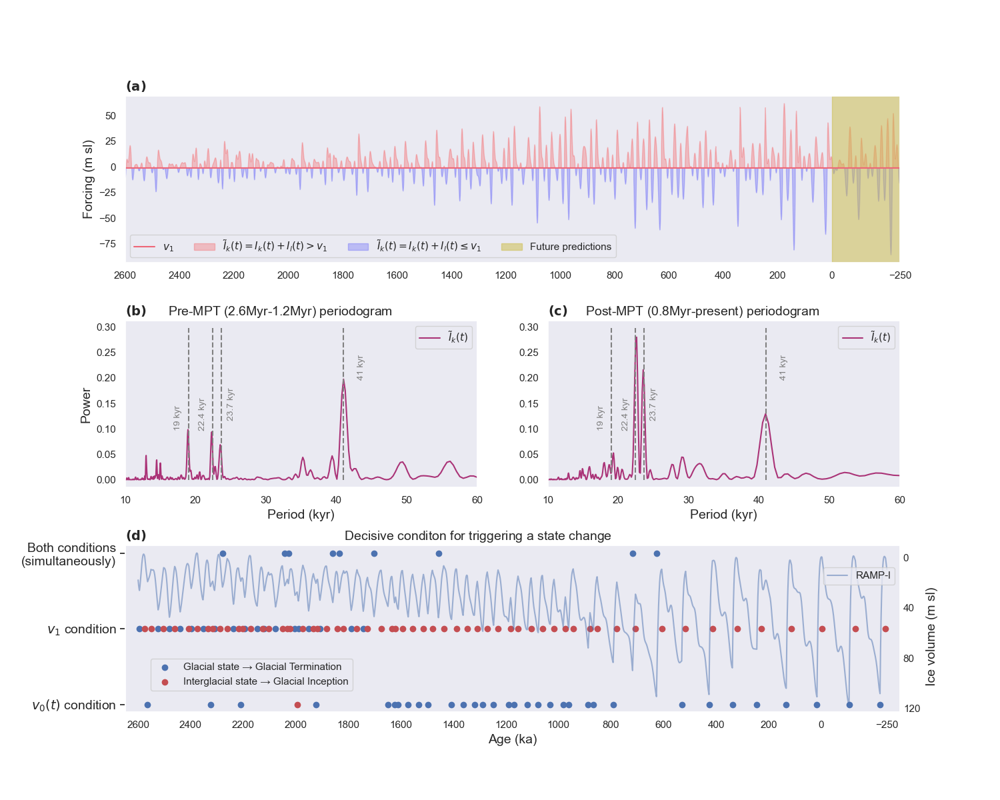

In [34]:
font = 14

plt.close('all')

fig, ax = plt.subplot_mosaic('AA;BC;DD', figsize=(15, 12))

################################
### Ik threshold plot
################################
ax['A'].axhline(xmin=time.min(), xmax=time.max(), y=RAMPl_data['v1'], color=bright.red, label=r'$v_1$')
# ax['A'].plot(time, insolation_threshold, label=r'Insolation (k thresholds)', color=bright.red)
ax['A'].fill_between(time, insolation_threshold, RAMPl_data['v1'], where=np.array(insolation_threshold)>RAMPl_data['v1'], color='red', alpha=0.2, label=r'$\tilde{I}_k(t)=I_k(t)+I_l(t)>v_1$')
ax['A'].fill_between(time, insolation_threshold, RAMPl_data['v1'], where=np.array(insolation_threshold)<=RAMPl_data['v1'], color='blue', alpha=0.2, label=r'$\tilde{I}_k(t)=I_k(t)+I_l(t)\leq v_1$')
ax['A'].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')
ax['A'].set_ylabel('Forcing (m sl)', fontsize=font)
ax['A'].legend(loc='lower left', fontsize=font-3, ncols=4)
ax['A'].set_xlim(time.max(), time.min())
ax['A'].set_xticks(np.hstack((np.arange(2600, -1, -200),-250)))

################################
### Periodogram pre-MPT
################################
ax['B'].plot(1/f_insolation_LombScargle_pre, P_insolation_LombScargle_pre, color=bright.purple, label=r'$\tilde{I}_k(t)$')
# mark obliquity and precession cycles + 100 kyr
ax['B'].vlines([41, 23.7, 22.4, 19], 0, np.max(P_insolation_LombScargle_pre)+0.1, color='grey', linestyle='--')

ax['B'].set_xlabel("Period (kyr)", fontsize=font)
ax['B'].set_ylabel(r"Power", fontsize=font)
ax['B'].legend()


################################
### Periodogram pre-MPT
################################
ax['C'].plot(1/f_insolation_LombScargle_post, P_insolation_LombScargle_post, color=bright.purple, label=r'$\tilde{I}_k(t)$')
# mark obliquity and precession cycles + 100 kyr
ax['C'].vlines([41, 23.7, 22.4, 19], 0, np.max(P_insolation_LombScargle_pre)+0.1, color='grey', linestyle='--')

ax['C'].set_xlabel("Period (kyr)", fontsize=font)
ax['C'].legend()

for axis in [ax['B'], ax['C']]:
    axis.text(43, 0.2, '41 kyr', color='grey', rotation=90, fontsize=10)
    axis.text(24.5, 0.12, '23.7 kyr', color='grey', rotation=90, fontsize=10)
    axis.text(20.5, 0.1, '22.4 kyr', color='grey', rotation=90, fontsize=10)
    axis.text(17, 0.1, '19 kyr', color='grey', rotation=90, fontsize=10)
    axis.set_xlim(10,60)


################################
### v(t) plot
################################

ax['D'].scatter(time[terminations_id], np.array(changes)[terminations], color='b', label='Glacial state → Glacial Termination')
ax['D'].scatter(time[inceptions_id], np.array(changes)[inceptions], color='r', label='Interglacial state → Glacial Inception')
ax['D'].set_xlabel('Age (ka)', fontsize=font)
ax['D'].set_yticks(ticks=[1,2,3], labels=[r'$v_0(t)$ condition', r'$v_1$ condition', 'Both conditions\n(simultaneously)'], fontsize=font)
ax['D'].set_xlim(2650, -300)
ax['D'].set_xticks(np.hstack((np.arange(2600, -1, -200),-250)))

ax2 = ax['D'].twinx()
ax2.plot(RAMPl_data['time'], RAMPl_data['icevolume'], color='b', label='RAMP-l', alpha=0.5)
ax2.set_xlabel('Ice volume (m sl)', fontsize=font)
ax2.text(-400, 100, 'Ice volume (m sl)', rotation=90, fontsize=font)
# ax2.text(-450, 100, 'Ramp-l', color='b', alpha=0.5, rotation=90, fontsize=font)
ax2.set_yticks([0, 40, 80, 120], ['0', '40', '80', '120'])
ax2.yaxis.set_tick_params(length=0,labelbottom=False)
ax2.invert_yaxis()

ax['D'].legend(loc='upper right', bbox_to_anchor=[0.3, 0.35], fontsize=font-3)
ax2.legend(loc='upper right', bbox_to_anchor=[1., 0.9], fontsize=font-3)
ax2.grid(False)

################################
################################
ax['A'].set_title(rf"$\bf{{(a)}}$ {'':^65}", loc="left", fontsize=font)
ax['B'].set_title(rf"$\bf{{(b)}}$ {f'Pre-MPT (2.6Myr-{time[pre]*1e-3:.1f}Myr) periodogram':^45}", loc="left", fontsize=font)
ax['C'].set_title(rf"$\bf{{(c)}}$ {f'Post-MPT ({time[post]*1e-3:.1f}Myr-present) periodogram':^45}", loc="left", fontsize=font)
ax['D'].set_title(rf"$\bf{{(d)}}$ {'Decisive conditon for triggering a state change':^155}", loc="left", fontsize=font)

# plt.tight_layout()
plt.subplots_adjust(hspace=0.35)
plt.savefig('Plots/f07.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## 8. Figure 8 - Large Ice Sheet sensitivity for last 900 kyr RAMP-l

In [35]:
# load pickled data sets
with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)

params = RAMPl_data['params']
time = RAMPl_data['time']
Esi = np.array(RAMPl_data['Esi'][::2])
Eco = np.array(RAMPl_data['Eco'][::2])
EnO = np.array(RAMPl_data['EnO'][::2])
esinomega = np.array(RAMPl_data['esinomega'])
ecosomega = np.array(RAMPl_data['ecosomega'])
O = np.array(RAMPl_data['O'])
icevolume = RAMPl_data['icevolume']

insolation_alpha = params['aEsi']*Esi + params['aEco']*Eco + params['aO']*EnO

insolation_k = params['kEsi']*Esi + params['kEco']*Eco + params['kO']*EnO

insolation_l = [params['lEsi']*icevolume[i]*Esi[i] + params['lEco']*icevolume[i]*Eco[i] + params['lO']*icevolume[i]*EnO[i] for i in range(len(icevolume))]

insolation_threshold_precession = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i]  for i in range(len(icevolume))]

insolation_threshold_obliquity = [(params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

insolation_threshold = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i] + (params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

In [39]:
mask = []
states = np.where(np.array(RAMPl_data['state'])==1, True, False)
        
state_times = RAMPl_data['time'][states]
state_times = state_times[state_times>=0]
state_times[-100:]

array([608., 607., 530., 529., 528., 527., 526., 525., 524., 523., 522.,
       521., 520., 519., 518., 517., 516., 426., 425., 424., 423., 422.,
       421., 420., 419., 418., 417., 416., 415., 414., 337., 336., 335.,
       334., 333., 332., 331., 330., 329., 328., 327., 326., 325., 324.,
       323., 322., 321., 320., 244., 243., 242., 241., 240., 239., 238.,
       237., 236., 235., 234., 233., 232., 231., 230., 229., 132., 131.,
       130., 129., 128., 127., 126., 125., 124., 123., 122., 121., 120.,
       119., 118., 117., 116., 115., 114., 113.,  15.,  14.,  13.,  12.,
        11.,  10.,   9.,   8.,   7.,   6.,   5.,   4.,   3.,   2.,   1.,
        -0.])

In [40]:
# Function to find continuous intervals
def find_intervals(time_array):
    intervals = []
    start = time_array[0]

    # step size
    step = RAMPl_data['resolution']*1e-3
    
    for i in range(1, len(time_array)):
        if not math.isclose(time_array[i], time_array[i-1]-step):
        # if time_array[i]==time_array[i-1]-1:
            intervals.append((time_array[i-1], start))
            start = time_array[i]
    intervals.append((time_array[-1], start))
    return intervals

# Find glacial intervals
interglacial_intervals = find_intervals(state_times)
interglacial_intervals

[(2575.0, 2594.0),
 (2551.0, 2563.0),
 (2503.0, 2523.0),
 (2461.0, 2480.0),
 (2407.0, 2439.0),
 (2374.0, 2397.0),
 (2333.0, 2352.0),
 (2316.0, 2324.0),
 (2288.0, 2308.0),
 (2261.0, 2278.0),
 (2218.0, 2236.0),
 (2201.0, 2208.0),
 (2172.0, 2193.0),
 (2126.0, 2146.0),
 (2104.0, 2119.0),
 (2051.0, 2076.0),
 (2032.0, 2041.0),
 (2022.0, 2027.0),
 (1995.0, 2002.0),
 (1973.0, 1989.0),
 (1933.0, 1950.0),
 (1917.0, 1922.0),
 (1883.0, 1907.0),
 (1841.0, 1858.0),
 (1818.0, 1834.0),
 (1767.0, 1788.0),
 (1727.0, 1742.0),
 (1675.0, 1701.0),
 (1634.0, 1648.0),
 (1620.0, 1623.0),
 (1594.0, 1609.0),
 (1555.0, 1571.0),
 (1514.0, 1530.0),
 (1480.0, 1496.0),
 (1437.0, 1456.0),
 (1388.0, 1406.0),
 (1347.0, 1362.0),
 (1309.0, 1319.0),
 (1271.0, 1287.0),
 (1230.0, 1246.0),
 (1182.0, 1189.0),
 (1154.0, 1169.0),
 (1104.0, 1117.0),
 (1061.0, 1076.0),
 (1017.0, 1030.0),
 (974.0, 981.0),
 (944.0, 960.0),
 (880.0, 886.0),
 (853.0, 866.0),
 (778.0, 791.0),
 (707.0, 717.0),
 (607.0, 626.0),
 (516.0, 530.0),
 (414.0, 

In [41]:
# Calculate Terminations (durations)
terminations = len(interglacial_intervals) + 1
# first glacial (if exist)
Ts = {'T1': interglacial_intervals[-1][0]-0}

for i in range(terminations-2):
    Ts[f'T{i+2}'] = interglacial_intervals[-(i+2)][0] - interglacial_intervals[-(i+1)][1] - 1

# last glacial (if exist)
Ts[f'T{terminations}'] = -RAMPl_data['start_year'] - interglacial_intervals[0][1]

Ts

{'T1': -0.0,
 'T2': 97.0,
 'T3': 96.0,
 'T4': 75.0,
 'T5': 76.0,
 'T6': 89.0,
 'T7': 76.0,
 'T8': 80.0,
 'T9': 60.0,
 'T10': 61.0,
 'T11': 13.0,
 'T12': 57.0,
 'T13': 13.0,
 'T14': 35.0,
 'T15': 30.0,
 'T16': 27.0,
 'T17': 36.0,
 'T18': 12.0,
 'T19': 40.0,
 'T20': 24.0,
 'T21': 21.0,
 'T22': 27.0,
 'T23': 25.0,
 'T24': 30.0,
 'T25': 23.0,
 'T26': 17.0,
 'T27': 24.0,
 'T28': 22.0,
 'T29': 10.0,
 'T30': 10.0,
 'T31': 26.0,
 'T32': 25.0,
 'T33': 24.0,
 'T34': 29.0,
 'T35': 6.0,
 'T36': 24.0,
 'T37': 9.0,
 'T38': 10.0,
 'T39': 22.0,
 'T40': 5.0,
 'T41': 19.0,
 'T42': 4.0,
 'T43': 9.0,
 'T44': 27.0,
 'T45': 6.0,
 'T46': 25.0,
 'T47': 7.0,
 'T48': 9.0,
 'T49': 24.0,
 'T50': 9.0,
 'T51': 7.0,
 'T52': 8.0,
 'T53': 21.0,
 'T54': 9.0,
 'T55': 21.0,
 'T56': 22.0,
 'T57': 27.0,
 'T58': 11.0,
 'T59': 6.0}

In [42]:
glacial_end_idx = []
glacial_ends = []
step = RAMPl_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMPl_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

print(glacial_ends[:5], glacial_end_idx[:5])

[2595.0, 2564.0, 2524.0, 2481.0, 2440.0] [5, 36, 76, 119, 160]


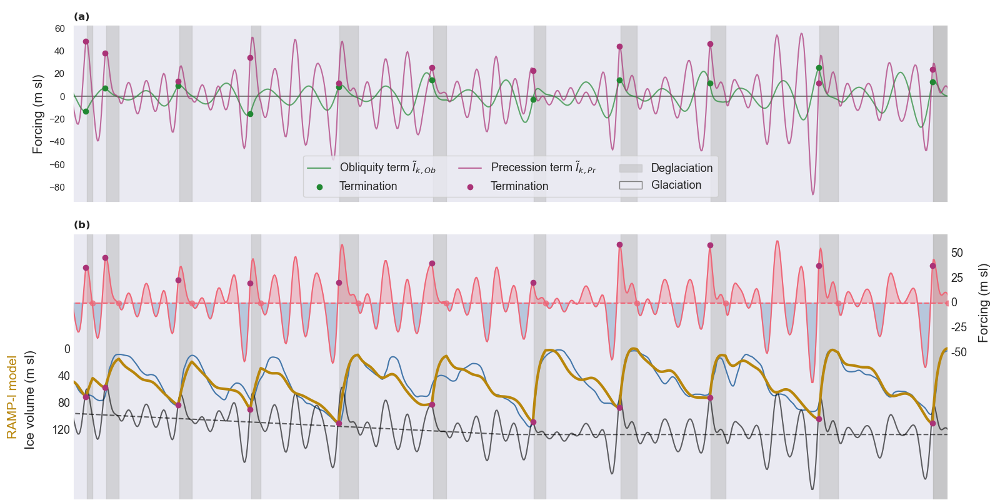

In [43]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, [ax0,ax1] = plt.subplots(nrows=2, figsize=(16,8), sharex=True, height_ratios=[2,3])
fig.tight_layout(pad=7.0)

##############################################################################################################################################
# 1st subbplot: Obliquity + Precession(+ co-p...)
##############################################################################################################################################

ax0.hlines(xmin=900, xmax=0, y=0, color='grey')
ax0.plot(RAMPl_data['time'], insolation_threshold_obliquity, color=bright.green, alpha=0.7, label=r"Obliquity term $\tilde{I}_{k,Ob}$")
ax0.scatter(glacial_ends, np.array(insolation_threshold_obliquity)[glacial_end_idx], color=bright.green, zorder=10, label='Termination')

ax0.plot(RAMPl_data['time'], insolation_threshold_precession, color=bright.purple, alpha=0.7, label=r"Precession term $\tilde{I}_{k,Pr}$")
ax0.scatter(glacial_ends, np.array(insolation_threshold_precession)[glacial_end_idx], color=bright.purple, zorder=10, label='Termination')

# Shade interglacial intervals
terminations = [
    "I", "II", "III", "IV", "V", "VI", "VII", "VIII", "IX", "X",
    "XI", "XII", "XIII", "XIV", "XV", "XVI", "XVII", "XVIII", "XIX", "XX",
    "XXI", "XXII", "XXIII", "XXIV", "XXV"]
for i, interval in enumerate(interglacial_intervals[::-1]):
    if i==0:
        ax0.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5, label='Deglaciation')
    ax0.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5)
    # if i>7 and i<19:
    #     plt.text((interval[1]+interval[0])/2, -65, f'T{terminations[i]}', rotation=0, horizontalalignment='center', alpha=0.6, fontsize=font-2)

# Add label for glaciation state
glacial_label = mpatches.Patch(facecolor=plt.gca().get_facecolor(), edgecolor='grey', label='Glaciation')

# Get the current handles and labels, add glacial_label
handles_ax0, labels_ax0 = ax0.get_legend_handles_labels()
handles_ax0.append(glacial_label)
labels_ax0.append('Glaciation')

# # change position in legend, s.t. 'Deglaciation' and 'Glaciation' are adjacent -> looks nicer
# def change_pos(in_arr, pick_idx, put_idx ):  
#     new_arr = in_arr.copy()
#     range_arr = np.arange(in_arr.size)  
#     tmp = in_arr[pick_idx]
#     new_arr[range_arr != put_idx ] = in_arr[range_arr != pick_idx]
#     new_arr[put_idx] = tmp
#     return new_arr

# handles = list(change_pos(handles, 4, 8))
# labels = list(change_pos(labels, 4, 8))


# ax0.legend(handles=handles_ax0, labels=labels_ax0, ncols=3, bbox_to_anchor=(0.5, -0.08), loc='upper center', fontsize=font-2)
ax0.legend(handles=handles_ax0, labels=labels_ax0, ncols=3, loc='best', fontsize=font-2)
ax0.set_ylabel('Forcing (m sl)', fontsize=font)

##############################################################################################################################################
# 2nd subbplot: Ice volume + Bounds
##############################################################################################################################################
ax1.plot(RAMPl_data['time_sea'], RAMPl_data['sea'], linestyle="-" , color=bright.blue, label='Berends et al. (2021)')
ax1.plot(RAMPl_data['time'], RAMPl_data['icevolume'], color='darkgoldenrod', label="RAMP-l v(t)", linewidth=3, zorder=9)
ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0s'], color=bright.black, linestyle='--', alpha=0.6, label=r"$v_0(t)$")
ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0_bounds'], color=bright.black, linestyle='-', alpha=0.6, label=r"Degl. threshold: $v_0(t)-\tilde{I}_k(t)$")

ax0.invert_xaxis()
# ax0.set_xlabel('Age (kyr)')
ax0.set_xlim(900,0)


# # with markers
# ax1.plot(RAMPl_data['time'], RAMPl_data['icevolume'], color=bright.blue, marker='o', label="RAMP model v(t)", linewidth=3, zorder=9)
# ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0_bounds'], color=bright.black, marker='o', linestyle='-', alpha=0.6, label=f"Deglaciation threshold")
# ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v1_bounds'], color=bright.red, marker='o', alpha=1, label="Insolation")
# ax1.axvspan(1200, 800, color=bright.grey, alpha=0.8)

# marks intersection points between v and v_0(t) (manually indentified)
# intersections = [[426,102.2], [337,71.5], [245,79.25], [219,57.1], [131,80.367], [17, 117.5]]
# for i, intersect in enumerate(intersections):
#     if i==len(intersections)-1:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10, label='v(t) > Degl. threshold')
#     else:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10)

# mark intersection points between v and v_0(t)
# at first get indices of end points of glacial states
glacial_end_idx = []
glacial_ends = []
step = RAMPl_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMPl_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

ax1.scatter(glacial_ends, RAMPl_data['icevolume'][glacial_end_idx], color=bright.purple, zorder=10, label='v(t) > Degl. threshold')


ax2 = ax1.twinx()
ax2.axhline(RAMPl_data['v1'], -RAMPl_data['future_time'], -RAMPl_data['start_year'], linestyle='--', color=bright.red, alpha=1, label=r"$v_1$")
ax2.plot(RAMPl_data['time'], insolation_threshold, color=bright.red, alpha=1, label=r"Forcing $\tilde{I}_k(t)$")

# shade the area where insolation>=v1
ax2.fill_between(x=RAMPl_data['time_bounds'], y1=RAMPl_data['v1_bounds'], y2=RAMPl_data['v1'], where=(RAMPl_data['v1_bounds'] >= RAMPl_data['v1']), color=bright.red, alpha=0.3, label=r'$\tilde{I}_k\geq$ $v_1$')

# shade the area where insolation<v1
ax2.fill_between(x=RAMPl_data['time_bounds'], y1=RAMPl_data['v1_bounds'], y2=RAMPl_data['v1'], where=(RAMPl_data['v1_bounds'] < RAMPl_data['v1']), color=bright.blue, alpha=0.3, label=r'$\tilde{I}_k < v_1$')


# mark position at end of interglacial for v1 
for interglacial_end in np.array(interglacial_intervals)[:,0]:
    ax2.scatter(interglacial_end, RAMPl_data['v1'], color=bright.red, alpha=0.7, zorder=10)

ax2.scatter(glacial_ends, RAMPl_data['v1_bounds'][glacial_end_idx], color=bright.purple, zorder=10)

# Shade interglacial intervals
terminations = [
    "I", "II", "III", "IV", "V", "VI", "VII", "VIII", "IX", "X",
    "XI", "XII", "XIII", "XIV", "XV", "XVI", "XVII", "XVIII", "XIX", "XX",
    "XXI", "XXII", "XXIII", "XXIV", "XXV"]
for i, interval in enumerate(interglacial_intervals[::-1]):
    if i==0:
        ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5, label='Deglaciation')
    ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5)
    # if i>7 and i<19:
    #     plt.text((interval[1]+interval[0])/2, -65, f'T{terminations[i]}', rotation=0, horizontalalignment='center', alpha=0.6, fontsize=font-2)


ax1.invert_yaxis()
ax1.invert_xaxis()

# ax1.set_yticks(ticks=[-170, 0, 20, 40, 60, 80, 100, 120], labels=['', '0', '20', '40', '60', '80', '100', '120'], fontsize=font)
ax1.set_yticks(ticks=[-170, 0, 40, 80, 120], labels=['', '0', '40', '80', '120'], fontsize=font-2)
ax2.set_yticks(ticks=[-200, -50, -25, 0, 25, 50], labels=['', '-50', '-25', '0', '25', '50'], fontsize=font-2)
ax1.yaxis.set_tick_params(length=0,labelbottom=True)
ax2.yaxis.set_tick_params(length=0,labelbottom=False)

ax1.text(-0.055, 0.20, 'Ice volume (m sl)', rotation=90, transform=ax1.transAxes, fontsize=font)
ax1.text(-0.075, 0.24, 'RAMP-l model', color='darkgoldenrod', rotation=90, transform=ax1.transAxes, fontsize=font)
ax2.text(1.035, 0.60, 'Forcing (m sl)', rotation=90, transform=ax2.transAxes, fontsize=font)
# ax2.set_ylabel('Forcing (m sl)', fontsize=font)


##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################


# plt.xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax1.set_xlabel("Age (ka)", fontsize=font)
ax1.set_xticks(ticks=np.arange(900, -1, -100), labels=['900', '800', '700', '600', '500', '400', '300', '200', '100', '0'], fontsize=font-2)
plt.xlim(900,0)
# plt.ylim(150,-80)
# plt.xlim(1950,1920)
# plt.xlim(500,0)
# plt.xlim(0,-250)
# plt.xlim(-RAMPl_data['start_year'], -RAMPl_data['future_time'])


# Add label for glaciation state
glacial_label = mpatches.Patch(facecolor=plt.gca().get_facecolor(), edgecolor='grey', label='Glaciation')

# Get the current handles and labels, add glacial_label
handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
handles = np.hstack([handles_ax1, handles_ax2, glacial_label])
labels = np.hstack([labels_ax1, labels_ax2, 'Glaciation'])

# change position in legend, s.t. 'Deglaciation' and 'Glaciation' are adjacent -> looks nicer
def change_pos(in_arr, pick_idx, put_idx ):  
    new_arr = in_arr.copy()
    range_arr = np.arange(in_arr.size)  
    tmp = in_arr[pick_idx]
    new_arr[range_arr != put_idx ] = in_arr[range_arr != pick_idx]
    new_arr[put_idx] = tmp
    return new_arr

handles = list(change_pos(handles, 5, 9))
labels = list(change_pos(labels, 5, 9))


fig.legend(handles=handles, labels=labels, ncol=6, bbox_to_anchor=(0.5, -0.08), loc='upper center', fontsize=font-2)


ax0.set_title(rf"$\bf{{(a)}}$ {''}", loc="left")
ax1.set_title(rf"$\bf{{(b)}}$ {''}", loc="left")

# fig.legend(ncol=5, loc=8, fontsize=font)
plt.tight_layout()
plt.subplots_adjust(bottom=0.0)  
if title!=None:
    plt.title(title, fontsize=15)
plt.savefig('Plots/f08.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

# A. Supplementary Figures

## A.1. Figure A.1 - Model Residuals

In [44]:
# load pickled data sets
with open('Data/ORB2_jax_2,6Myr.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_2,6Myr.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_2,6Myr.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)
    
    
# calculate the residuals (model-data)
residuals_orb = (ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])
residuals_orb_norm = (ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea']) / np.std(ORB_data['sea'])

residuals_abr = ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea']
residuals_abr_norm = (ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea']) / np.std(ABR_data['sea'])

residuals_grad = (GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea']) 
residuals_grad_norm = (GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea']) / np.std(GRAD_data['sea'])

residuals_ramp = RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea']
residuals_ramp_norm = (RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea']) / np.std(RAMP_data['sea'])

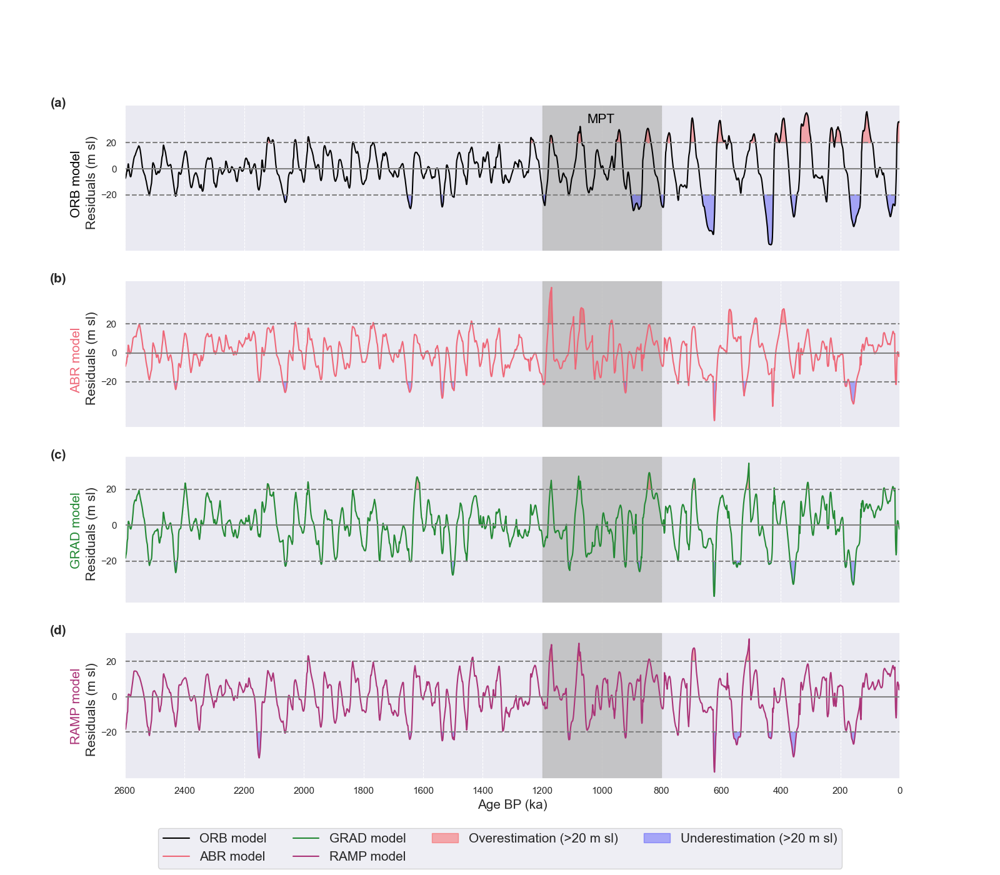

In [45]:
font = 15
title = None
boundary = 20

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True)

##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
ax[0].plot(ORB_data['time_sea'], residuals_orb, linestyle="-" , color=bright.black, label="ORB model")
ax[0].hlines(0, -ORB_data['start_year'], 0, color='grey')
ax[0].hlines(boundary, -ORB_data['start_year'], 0, linestyle='--', color='grey')
ax[0].hlines(-boundary, -ORB_data['start_year'], 0, linestyle='--', color='grey')
ax[0].axvspan(1200, 800, color=bright.grey, alpha=0.8)

ax[0].text(x=1050, y=35, s='MPT', color=bright.black, fontsize=font)

# Highlight areas above boundary and below -boundary
ax[0].fill_between(ORB_data['time_sea'], residuals_orb, boundary, where=(residuals_orb >= boundary), color='red', alpha=0.3)
ax[0].fill_between(ORB_data['time_sea'], residuals_orb, -boundary, where=(residuals_orb <= -boundary), color='blue', alpha=0.3)

ax[0].set_xlim(-ORB_data['start_year'], 0)
ax[0].set_yticks([boundary, 0, -boundary])

ax[0].invert_xaxis()


##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
ax[1].plot(ABR_data['time_sea'], residuals_abr, linestyle="-" , color=bright.red, label="ABR model")
ax[1].hlines(0, -ABR_data['start_year'], 0, color='grey')
ax[1].hlines(boundary, -ABR_data['start_year'], 0, linestyle='--', color='grey')
ax[1].hlines(-boundary, -ABR_data['start_year'], 0, linestyle='--', color='grey')
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)

# Highlight areas above boundary and below -boundary
ax[1].fill_between(ABR_data['time_sea'], residuals_abr, boundary, where=(residuals_abr >= boundary), color='red', alpha=0.3)
ax[1].fill_between(ABR_data['time_sea'], residuals_abr, -boundary, where=(residuals_abr <= -boundary), color='blue', alpha=0.3)

ax[1].set_xlim(-ORB_data['start_year'], 0)
ax[1].set_yticks([boundary, 0, -boundary])


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
ax[2].plot(GRAD_data['time_sea'], residuals_grad, linestyle="-" , color=bright.green, label="GRAD model")
ax[2].hlines(0, -GRAD_data['start_year'], 0, color='grey')
ax[2].hlines(boundary, -GRAD_data['start_year'], 0, linestyle='--', color='grey')
ax[2].hlines(-boundary, -GRAD_data['start_year'], 0, linestyle='--', color='grey')
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)

# Highlight areas above boundary and below -boundary
ax[2].fill_between(GRAD_data['time_sea'], residuals_grad, boundary, where=(residuals_grad >= boundary), color='red', alpha=0.3)
ax[2].fill_between(GRAD_data['time_sea'], residuals_grad, -boundary, where=(residuals_grad <= -boundary), color='blue', alpha=0.3)

ax[2].set_xlim(-GRAD_data['start_year'], 0)
ax[2].set_yticks([boundary, 0, -boundary])


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
ax[3].plot(RAMP_data['time_sea'], residuals_ramp, linestyle="-" , color=bright.purple, label="RAMP model")
ax[3].hlines(0, -RAMP_data['start_year'], 0, color='grey')
ax[3].hlines(boundary, -RAMP_data['start_year'], 0, linestyle='--', color='grey')
ax[3].hlines(-boundary, -RAMP_data['start_year'], 0, linestyle='--', color='grey')
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)

# Highlight areas above boundary and below -boundary
ax[3].fill_between(RAMP_data['time_sea'], residuals_ramp, boundary, where=(residuals_ramp >= boundary), color='red', alpha=0.3, label='Overestimation (>20 m sl)')
ax[3].fill_between(RAMP_data['time_sea'], residuals_ramp, -boundary, where=(residuals_ramp <= -boundary), color='blue', alpha=0.3, label='Underestimation (>20 m sl)')

ax[3].set_xlim(-GRAD_data['start_year'], 0)
ax[3].set_yticks([boundary, 0, -boundary])

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[3].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax[3].set_xlabel("Age BP (ka)", fontsize=font)
# ax[0].grid(False)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
model_name =['ORB model', 'ABR model', 'GRAD model', 'RAMP model']
model_color = [bright.black, bright.red, bright.green, bright.purple]
for i in range(4):
    ax[i].text(-0.05, 0.17, 'Residuals (m sl)', rotation=90, transform=ax[i].transAxes, fontsize=font)
    ax[i].text(-0.07, 0.25, model_name[i], color=model_color[i], rotation=90, transform=ax[i].transAxes, fontsize=font)
    ax[i].text(-0.075, 1.05, panel_label[i], transform=ax[i].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i].grid(True, which='both', linestyle='--', linewidth=0.75)

fig.legend(ncols=4, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)
plt.savefig('Plots/f09.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## A.2. Figure A.2 - 2 Myr Model Comparison

In [47]:
# load pickled data sets
with open('Data/ORB2_jax_2Myr.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_2Myr.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_2Myr.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_2Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)
    
    
# calculate the rmse
rmse_orb = np.sqrt(np.sum((ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])**2)/len(ORB_data['sea']))
rmse_abr = np.sqrt(np.sum((ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea'])**2)/len(ABR_data['sea']))
rmse_grad = np.sqrt(np.sum((GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea'])**2)/len(GRAD_data['sea']))
rmse_ramp = np.sqrt(np.sum((RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea'])**2)/len(RAMP_data['sea']))

r2_orb = r2_score(y_pred=ORB_data['icevolume'][:len(ORB_data['sea'])], y_true=ORB_data['sea'])
r2_abr = r2_score(y_pred=ABR_data['icevolume'][:len(ABR_data['sea'])], y_true=ABR_data['sea'])
r2_grad = r2_score(y_pred=GRAD_data['icevolume'][:len(GRAD_data['sea'])], y_true=GRAD_data['sea'])
r2_ramp = r2_score(y_pred=RAMP_data['icevolume'][:len(RAMP_data['sea'])], y_true=RAMP_data['sea'])

print(rmse_orb, rmse_abr, rmse_grad, rmse_ramp)
print(r2_orb, r2_abr, r2_grad, r2_ramp)

16.042855891424598 12.066874612135333 11.7097855223194 11.59219609571252
0.5565850550471894 0.7491370287634196 0.76376467313431 0.768485391481284


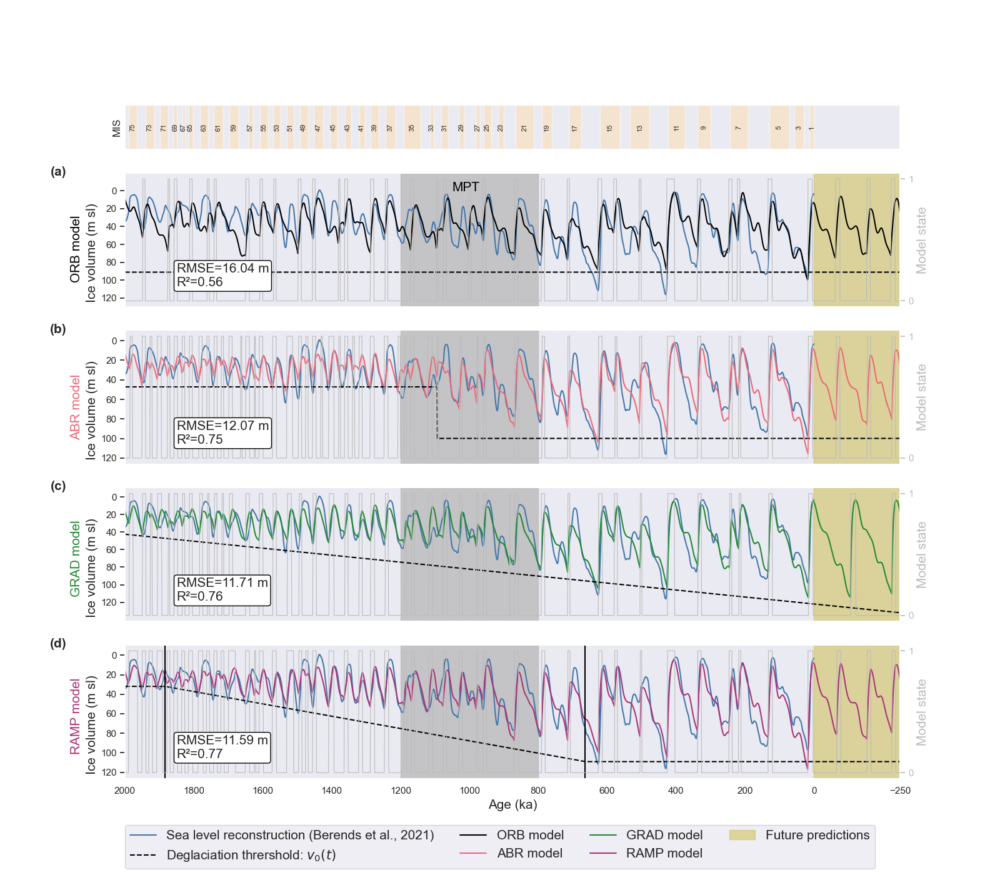

In [48]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2000 and (int(label)%2!=0):
        ax[0].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2000:
            # ax[0].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax[0].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax[0].set_ylim(0, 1)
# ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_ylabel('MIS')


##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
ax[1].plot(ORB_data['time_sea'], ORB_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax[1].plot(ORB_data['time_bounds'], ORB_data['v0s'], linestyle="--" , color=bright.black, label=r"Deglaciation thrershold: $v_0(t)$")
ax[1].plot(ORB_data['time'], ORB_data['icevolume'], color=bright.black, label="ORB model")
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[1].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[1].set_yticks([0, 40, 80, 120])

ax2 = ax[1].twinx()
ax2.plot(ORB_data['time'], ORB_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=1850, y=0.12, s=f"RMSE={rmse_orb:.2f} m\nR²={r2_orb:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[1].set_xlim(-ORB_data['start_year'],-ORB_data['future_time'])
# ax[1].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax[1].set_ylim(-20, 130)

ax[1].invert_yaxis()
# ax[1].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[1].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[1].transAxes, fontsize=font)
ax[1].text(-0.07, 0.2, 'ORB model', color=bright.black, rotation=90, transform=ax[1].transAxes, fontsize=font)

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
ax[2].plot(ABR_data['time_sea'], ABR_data['sea'], linestyle="-" , color=bright.blue)
ax[2].plot(ABR_data['time'], ABR_data['icevolume'], color=bright.red, label="ABR model")
ax[2].plot(ABR_data['time_bounds'], ABR_data['v0s'], linestyle="--" , color=bright.black)
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[2].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[2].set_yticks([0, 40, 80, 120])

ax2 = ax[2].twinx()
ax2.plot(ABR_data['time'], ABR_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=1850, y=0.12, s=f"RMSE={rmse_abr:.2f} m\nR²={r2_abr:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))


ax[2].set_xlim(-ABR_data['start_year'],-ABR_data['future_time'])
ax[2].set_ylim(np.min([np.min(ABR_data['v0s']), np.min(ABR_data['icevolume']), np.min(ABR_data['sea'])])-10,
               np.max([np.max(ABR_data['v0s']), np.max(ABR_data['icevolume']), np.max(ABR_data['sea'])])+10)

ax[2].invert_yaxis()
# ax[2].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[2].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[2].transAxes, fontsize=font)
ax[2].text(-0.07, 0.2, 'ABR model', color=bright.red, rotation=90, transform=ax[2].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
ax[3].plot(GRAD_data['time_sea'], GRAD_data['sea'], linestyle="-" , color=bright.blue)
ax[3].plot(GRAD_data['time'], GRAD_data['icevolume'], color=bright.green, label="GRAD model")
ax[3].plot(GRAD_data['time_bounds'], GRAD_data['v0s'], linestyle="--" , color=bright.black)
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[3].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[3].set_yticks([0, 40, 80, 120])

ax2 = ax[3].twinx()
ax2.plot(GRAD_data['time'], GRAD_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=1850, y=0.12, s=f"RMSE={rmse_grad:.2f} m\nR²={r2_grad:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[3].set_xlim(-GRAD_data['start_year'],-GRAD_data['future_time'])
ax[3].set_ylim(np.min([np.min(GRAD_data['v0s']), np.min(GRAD_data['icevolume']), np.min(GRAD_data['sea'])])-10,
               np.max([np.max(GRAD_data['v0s']), np.max(GRAD_data['icevolume']), np.max(GRAD_data['sea'])])+10)

ax[3].invert_yaxis()
# ax[3].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[3].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[3].transAxes, fontsize=font)
ax[3].text(-0.07, 0.2, 'GRAD model', color=bright.green, rotation=90, transform=ax[3].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
ax[4].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax[4].plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.purple, label="RAMP model")
ax[4].plot(RAMP_data['time_bounds'], RAMP_data['v0s'], linestyle="--" , color=bright.black)
# ax[4].vlines(x=RAMP_data['t2'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax[4].vlines(x=RAMP_data['t2'], ymin=-10, ymax=130, linestyle='-', color=bright.black)
ax[4].vlines(x=RAMP_data['t1'], ymin=-10, ymax=130, linestyle='-', color=bright.black)

# ax[4].vlines(x=RAMP_data['t1'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax[4].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[4].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax[4].set_yticks([0, 40, 80, 120])

ax2 = ax[4].twinx()
ax2.plot(RAMP_data['time'], RAMP_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=1850, y=0.12, s=f"RMSE={rmse_ramp:.2f} m\nR²={r2_ramp:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[4].set_xlim(-RAMP_data['start_year'],-RAMP_data['future_time'])
ax[4].set_ylim(np.min([np.min(RAMP_data['v0s']), np.min(RAMP_data['icevolume']), np.min(RAMP_data['sea'])])-10,
               np.max([np.max(RAMP_data['v0s']), np.max(RAMP_data['icevolume']), np.max(RAMP_data['sea'])])+10)


ax[4].invert_yaxis()
# ax[4].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax[4].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax[4].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[4].transAxes, fontsize=font)
ax[4].text(-0.07, 0.2, 'RAMP model', color=bright.purple, rotation=90, transform=ax[4].transAxes, fontsize=font)


ax2.set_ylabel('Model state', fontsize=font)

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[4].set_xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax[4].set_xlabel("Age (ka)", fontsize=font)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)
# ax[4].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i in range(4):
    ax[i+1].text(-0.075, 1.05, panel_label[i], transform=ax[i+1].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i+1].set_yticks([0,20,40,60,80,100,120])

fig.legend(ncol=4, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f10.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## A.3. Figure A.3 - 3.6 Myr Model Comparison

In [49]:
# load pickled data sets
with open('Data/ORB2_jax_3,6Myr.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_3,6Myr.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_3,6Myr.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_3,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)
    
    
# calculate the rmse
rmse_orb = np.sqrt(np.sum((ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])**2)/len(ORB_data['sea']))
rmse_abr = np.sqrt(np.sum((ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea'])**2)/len(ABR_data['sea']))
rmse_grad = np.sqrt(np.sum((GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea'])**2)/len(GRAD_data['sea']))
rmse_ramp = np.sqrt(np.sum((RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea'])**2)/len(RAMP_data['sea']))

r2_orb = r2_score(y_pred=ORB_data['icevolume'][:len(ORB_data['sea'])], y_true=ORB_data['sea'])
r2_abr = r2_score(y_pred=ABR_data['icevolume'][:len(ABR_data['sea'])], y_true=ABR_data['sea'])
r2_grad = r2_score(y_pred=GRAD_data['icevolume'][:len(GRAD_data['sea'])], y_true=GRAD_data['sea'])
r2_ramp = r2_score(y_pred=RAMP_data['icevolume'][:len(RAMP_data['sea'])], y_true=RAMP_data['sea'])

print(rmse_orb, rmse_abr, rmse_grad, rmse_ramp)
print(r2_orb, r2_abr, r2_grad, r2_ramp)

15.686185095146188 12.269776124153534 11.168642472503294 10.688418565624954
0.6412453467187083 0.7804991787743826 0.8181289184379705 0.8334326878693342


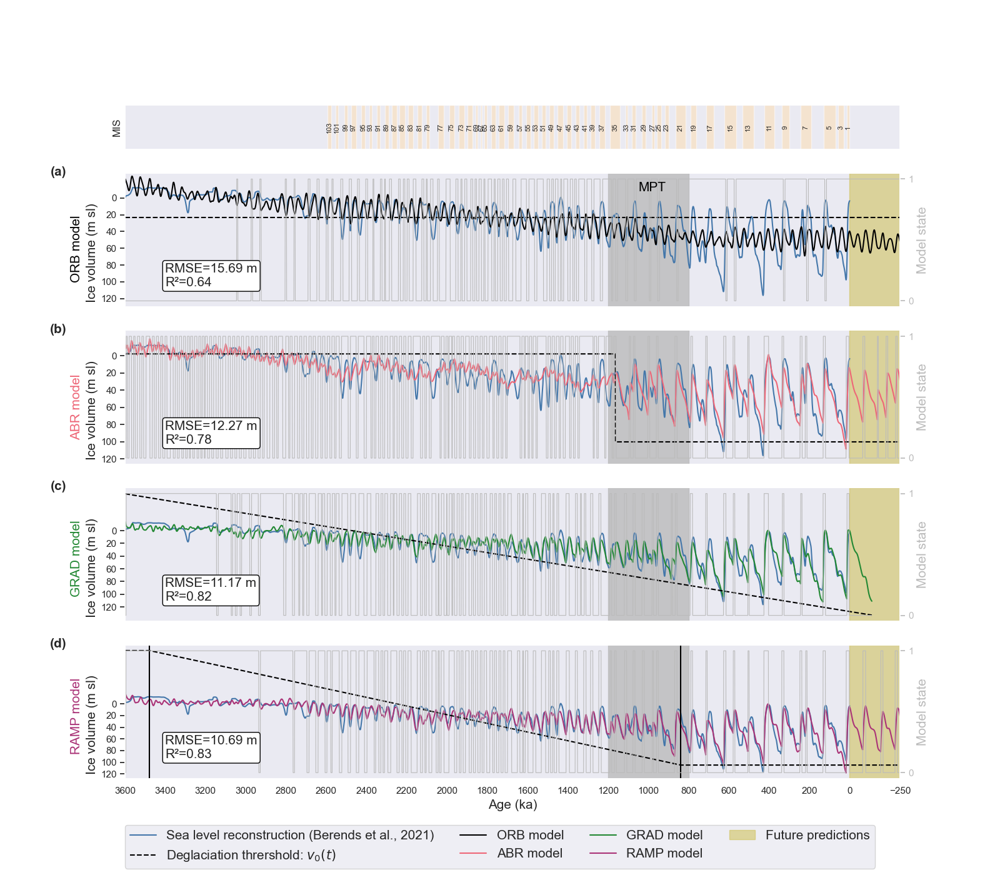

In [50]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=3600 and (int(label)%2!=0):
        ax[0].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=3600:
            # ax[0].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax[0].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax[0].set_ylim(0, 1)
# ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_ylabel('MIS')

##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
ax[1].plot(ORB_data['time_sea'], ORB_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax[1].plot(ORB_data['time_bounds'], ORB_data['v0s'], linestyle="--" , color=bright.black, label=r"Deglaciation thrershold: $v_0(t)$")
ax[1].plot(ORB_data['time'], ORB_data['icevolume'], color=bright.black, label="ORB model")
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[1].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[1].set_yticks([0, 40, 80, 120])

ax2 = ax[1].twinx()
ax2.plot(ORB_data['time'], ORB_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=3400, y=0.12, s=f"RMSE={rmse_orb:.2f} m\nR²={r2_orb:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[1].set_xlim(-ORB_data['start_year'],-ORB_data['future_time'])
# ax[1].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax[1].set_ylim(-30, 130)

ax[1].invert_yaxis()
# ax[1].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[1].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[1].transAxes, fontsize=font)
ax[1].text(-0.07, 0.2, 'ORB model', color=bright.black, rotation=90, transform=ax[1].transAxes, fontsize=font)

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
ax[2].plot(ABR_data['time_sea'], ABR_data['sea'], linestyle="-" , color=bright.blue)
ax[2].plot(ABR_data['time'], ABR_data['icevolume'], color=bright.red, label="ABR model")
ax[2].plot(ABR_data['time_bounds'], ABR_data['v0s'], linestyle="--" , color=bright.black)
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[2].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[2].set_yticks([0, 40, 80, 120])

ax2 = ax[2].twinx()
ax2.plot(ABR_data['time'], ABR_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=3400, y=0.12, s=f"RMSE={rmse_abr:.2f} m\nR²={r2_abr:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))


ax[2].set_xlim(-ABR_data['start_year'],-ABR_data['future_time'])
ax[2].set_ylim(np.min([np.min(ABR_data['v0s']), np.min(ABR_data['icevolume']), np.min(ABR_data['sea'])])-10,
               np.max([np.max(ABR_data['v0s']), np.max(ABR_data['icevolume']), np.max(ABR_data['sea'])])+10)

ax[2].invert_yaxis()
# ax[2].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[2].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[2].transAxes, fontsize=font)
ax[2].text(-0.07, 0.2, 'ABR model', color=bright.red, rotation=90, transform=ax[2].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
ax[3].plot(GRAD_data['time_sea'], GRAD_data['sea'], linestyle="-" , color=bright.blue)
ax[3].plot(GRAD_data['time'], GRAD_data['icevolume'], color=bright.green, label="GRAD model")
ax[3].plot(GRAD_data['time_bounds'], GRAD_data['v0s'], linestyle="--" , color=bright.black)
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[3].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[3].set_yticks([0, 40, 80, 120])

ax2 = ax[3].twinx()
ax2.plot(GRAD_data['time'], GRAD_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=3400, y=0.12, s=f"RMSE={rmse_grad:.2f} m\nR²={r2_grad:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[3].set_xlim(-GRAD_data['start_year'],-GRAD_data['future_time'])
ax[3].set_ylim(np.min([np.min(GRAD_data['v0s']), np.min(GRAD_data['icevolume']), np.min(GRAD_data['sea'])])-10,
               np.max([np.max(GRAD_data['v0s']), np.max(GRAD_data['icevolume']), np.max(GRAD_data['sea'])])+10)

ax[3].invert_yaxis()
# ax[3].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[3].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[3].transAxes, fontsize=font)
ax[3].text(-0.07, 0.2, 'GRAD model', color=bright.green, rotation=90, transform=ax[3].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
ax[4].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax[4].plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.purple, label="RAMP model")
ax[4].plot(RAMP_data['time_bounds'], RAMP_data['v0s'], linestyle="--" , color=bright.black)
# ax[4].vlines(x=RAMP_data['t2'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax[4].vlines(x=RAMP_data['t2'], ymin=np.min(RAMP_data['v0s'])-10, ymax=130, linestyle='-', color=bright.black)
ax[4].vlines(x=RAMP_data['t1'], ymin=np.min(RAMP_data['v0s'])-10, ymax=130, linestyle='-', color=bright.black)

# ax[4].vlines(x=RAMP_data['t1'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax[4].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[4].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax[4].set_yticks([0, 40, 80, 120])

ax2 = ax[4].twinx()
ax2.plot(RAMP_data['time'], RAMP_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=3400, y=0.12, s=f"RMSE={rmse_ramp:.2f} m\nR²={r2_ramp:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[4].set_xlim(-RAMP_data['start_year'],-RAMP_data['future_time'])
ax[4].set_ylim(np.min([np.min(RAMP_data['v0s']), np.min(RAMP_data['icevolume']), np.min(RAMP_data['sea'])])-10,
               np.max([np.max(RAMP_data['v0s']), np.max(RAMP_data['icevolume']), np.max(RAMP_data['sea'])])+10)


ax[4].invert_yaxis()
# ax[4].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax[4].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax[4].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[4].transAxes, fontsize=font)
ax[4].text(-0.07, 0.2, 'RAMP model', color=bright.purple, rotation=90, transform=ax[4].transAxes, fontsize=font)


ax2.set_ylabel('Model state', fontsize=font)

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[4].set_xticks([3600, 3400, 3200, 3000, 2800, 2600, 2400, 2200, 2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax[4].set_xlabel("Age (ka)", fontsize=font)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)
# ax[4].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i in range(4):
    ax[i+1].text(-0.075, 1.05, panel_label[i], transform=ax[i+1].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i+1].set_yticks([0,20,40,60,80,100,120])

fig.legend(ncol=4, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f11.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## A.4. Figure A.4 - Rohling sea level: 2.6 Myr Comparison

In [52]:
# load pickled data sets 
with open('Data/ORB2_jax_2,6Myr_rohling.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_2,6Myr_rohling.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_2,6Myr_rohling.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_2,6Myr_rohling.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)
    
    
# calculate the rmse
rmse_orb = np.sqrt(np.sum((ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])**2)/len(ORB_data['sea']))
rmse_abr = np.sqrt(np.sum((ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea'])**2)/len(ABR_data['sea']))
rmse_grad = np.sqrt(np.sum((GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea'])**2)/len(GRAD_data['sea']))
rmse_ramp = np.sqrt(np.sum((RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea'])**2)/len(RAMP_data['sea']))

r2_orb = r2_score(y_pred=ORB_data['icevolume'][:len(ORB_data['sea'])], y_true=ORB_data['sea'])
r2_abr = r2_score(y_pred=ABR_data['icevolume'][:len(ABR_data['sea'])], y_true=ABR_data['sea'])
r2_grad = r2_score(y_pred=GRAD_data['icevolume'][:len(GRAD_data['sea'])], y_true=GRAD_data['sea'])
r2_ramp = r2_score(y_pred=RAMP_data['icevolume'][:len(RAMP_data['sea'])], y_true=RAMP_data['sea'])

print(rmse_orb, rmse_abr, rmse_grad, rmse_ramp)
print(r2_orb, r2_abr, r2_grad, r2_ramp)

17.76374584953754 12.428883005457172 12.254415018699635 11.703768371815702
0.45304277709054364 0.7322382980591403 0.7397028405816898 0.7625699433618482


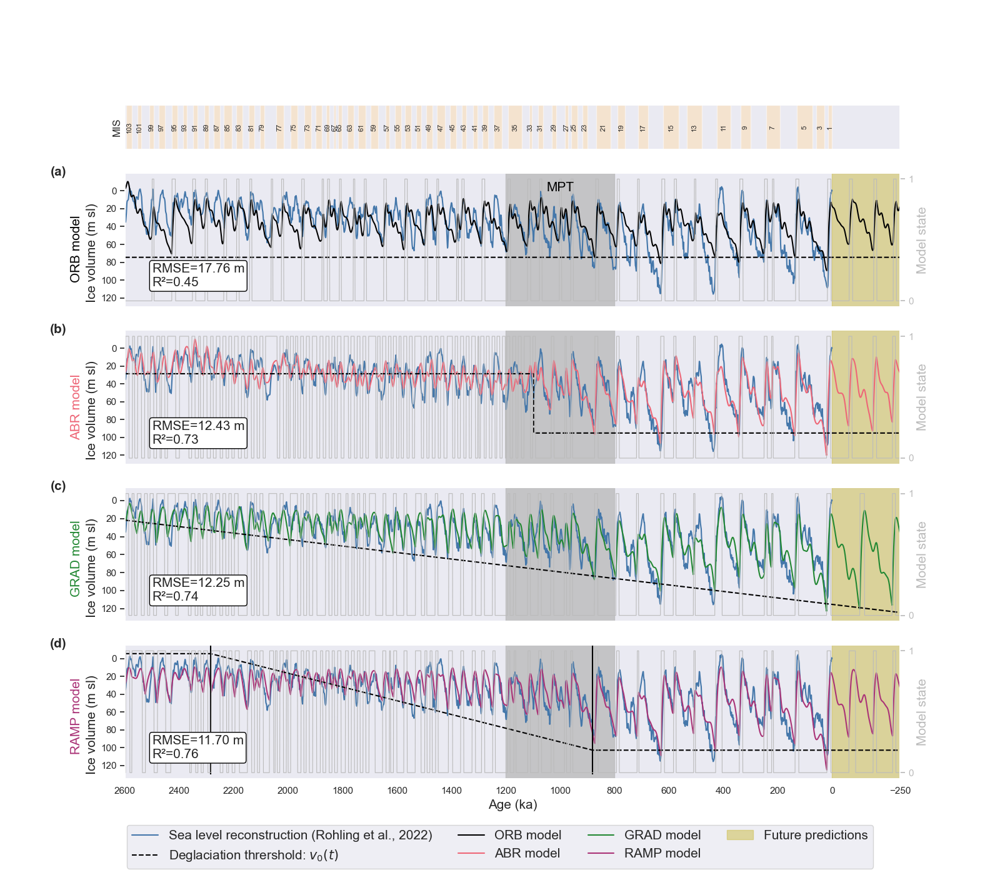

In [53]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=5, ncols=1, figsize=(16,14), sharex=True, height_ratios=[1,3,3,3,3])
# fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(24,14), sharex=True)

##############################################################################################################################################
# 0st plot: MIS bounds
##############################################################################################################################################
for start, end, label in bounds:
    if start<=2600 and (int(label)%2!=0):
        ax[0].axvspan(start, end, facecolor='navajowhite', edgecolor=None, alpha=0.5)
        if ((start+end)/2)<=2600:
            # ax[0].text(start+(end-start)/4, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
            ax[0].text((end+start)/2, 0.5, label, ha='center', va='center', fontsize=8, rotation=90)
ax[0].set_ylim(0, 1)
# ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_ylabel('MIS')

##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
ax[1].plot(ORB_data['time_sea'], ORB_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Rohling et al., 2022)")
ax[1].plot(ORB_data['time_bounds'], ORB_data['v0s'], linestyle="--" , color=bright.black, label=r"Deglaciation thrershold: $v_0(t)$")
ax[1].plot(ORB_data['time'], ORB_data['icevolume'], color=bright.black, label="ORB model")
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[1].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[1].set_yticks([0, 40, 80, 120])

ax2 = ax[1].twinx()
ax2.plot(ORB_data['time'], ORB_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)

ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_orb:.2f} m\nR²={r2_orb:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[1].set_xlim(-ORB_data['start_year'],-ORB_data['future_time'])
# ax[1].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax[1].set_ylim(-20, 130)

ax[1].invert_yaxis()
# ax[1].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[1].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[1].transAxes, fontsize=font)
ax[1].text(-0.07, 0.2, 'ORB model', color=bright.black, rotation=90, transform=ax[1].transAxes, fontsize=font)

ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
ax[2].plot(ABR_data['time_sea'], ABR_data['sea'], linestyle="-" , color=bright.blue)
ax[2].plot(ABR_data['time'], ABR_data['icevolume'], color=bright.red, label="ABR model")
ax[2].plot(ABR_data['time_bounds'], ABR_data['v0s'], linestyle="--" , color=bright.black)
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[2].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[2].set_yticks([0, 40, 80, 120])

ax2 = ax[2].twinx()
ax2.plot(ABR_data['time'], ABR_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_abr:.2f} m\nR²={r2_abr:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))


ax[2].set_xlim(-ABR_data['start_year'],-ABR_data['future_time'])
ax[2].set_ylim(np.min([np.min(ABR_data['v0s']), np.min(ABR_data['icevolume']), np.min(ABR_data['sea'])])-10,
               np.max([np.max(ABR_data['v0s']), np.max(ABR_data['icevolume']), np.max(ABR_data['sea'])])+10)

ax[2].invert_yaxis()
# ax[2].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[2].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[2].transAxes, fontsize=font)
ax[2].text(-0.07, 0.2, 'ABR model', color=bright.red, rotation=90, transform=ax[2].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
ax[3].plot(GRAD_data['time_sea'], GRAD_data['sea'], linestyle="-" , color=bright.blue)
ax[3].plot(GRAD_data['time'], GRAD_data['icevolume'], color=bright.green, label="GRAD model")
ax[3].plot(GRAD_data['time_bounds'], GRAD_data['v0s'], linestyle="--" , color=bright.black)
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[3].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[3].set_yticks([0, 40, 80, 120])

ax2 = ax[3].twinx()
ax2.plot(GRAD_data['time'], GRAD_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_grad:.2f} m\nR²={r2_grad:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[3].set_xlim(-GRAD_data['start_year'],-GRAD_data['future_time'])
ax[3].set_ylim(np.min([np.min(GRAD_data['v0s']), np.min(GRAD_data['icevolume']), np.min(GRAD_data['sea'])])-10,
               np.max([np.max(GRAD_data['v0s']), np.max(GRAD_data['icevolume']), np.max(GRAD_data['sea'])])+10)

ax[3].invert_yaxis()
# ax[3].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[3].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[3].transAxes, fontsize=font)
ax[3].text(-0.07, 0.2, 'GRAD model', color=bright.green, rotation=90, transform=ax[3].transAxes, fontsize=font)
ax2.set_ylabel('Model state', fontsize=font)


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
ax[4].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax[4].plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.purple, label="RAMP model")
ax[4].plot(RAMP_data['time_bounds'], RAMP_data['v0s'], linestyle="--" , color=bright.black)
# ax[4].vlines(x=RAMP_data['t2'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax[4].vlines(x=RAMP_data['t2'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color=bright.black)
ax[4].vlines(x=RAMP_data['t1'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color=bright.black)

# ax[4].vlines(x=RAMP_data['t1'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax[4].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[4].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax[4].set_yticks([0, 40, 80, 120])

ax2 = ax[4].twinx()
ax2.plot(RAMP_data['time'], RAMP_data['state'], linewidth = 0.8, color=bright.grey)
ax2.set_ylabel('Model state', color=bright.grey)

ax2.set_yticks([1,0])
ax2.tick_params(axis='y', colors=bright.grey)


# ax2.text(x=1050, y=0.9, s='MPT', color=bright.black, fontsize=font)
ax2.text(x=2500, y=0.12, s=f"RMSE={rmse_ramp:.2f} m\nR²={r2_ramp:.2f}", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[4].set_xlim(-RAMP_data['start_year'],-RAMP_data['future_time'])
ax[4].set_ylim(np.min([np.min(RAMP_data['v0s']), np.min(RAMP_data['icevolume']), np.min(RAMP_data['sea'])])-10,
               np.max([np.max(RAMP_data['v0s']), np.max(RAMP_data['icevolume']), np.max(RAMP_data['sea'])])+10)


ax[4].invert_yaxis()
# ax[4].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax[4].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax[4].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[4].transAxes, fontsize=font)
ax[4].text(-0.07, 0.2, 'RAMP model', color=bright.purple, rotation=90, transform=ax[4].transAxes, fontsize=font)


ax2.set_ylabel('Model state', fontsize=font)

##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[4].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax[4].set_xlabel("Age (ka)", fontsize=font)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)
# ax[4].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i in range(4):
    ax[i+1].text(-0.075, 1.05, panel_label[i], transform=ax[i+1].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i+1].set_yticks([0,20,40,60,80,100,120])

fig.legend(ncol=4, loc=8, fontsize=font)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f12.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## A.5. Figure A.5 - Rohling-Berends comparison 

In [54]:
# load pickled data sets (Berends)
with open('Data/ORB2_jax_2,6Myr.pkl', 'rb') as file:
    ORB_data = pickle.load(file)
    
with open('Data/ABR3_jax_2,6Myr.pkl', 'rb') as file:
    ABR_data = pickle.load(file)
    
with open('Data/GRAD_jax_2,6Myr.pkl', 'rb') as file:
    GRAD_data = pickle.load(file)
    
with open('Data/RAMP5_jax_2,6Myr.pkl', 'rb') as file:
    RAMP_data = pickle.load(file)

###########################################################################################

# load pickled data sets (Rohling)
with open('Data/ORB2_jax_2,6Myr_rohling.pkl', 'rb') as file:
    ORB_data_rohling = pickle.load(file)
    
with open('Data/ABR3_jax_2,6Myr_rohling.pkl', 'rb') as file:
    ABR_data_rohling = pickle.load(file)
    
with open('Data/GRAD_jax_2,6Myr_rohling.pkl', 'rb') as file:
    GRAD_data_rohling = pickle.load(file)
    
with open('Data/RAMP5_jax_2,6Myr_rohling.pkl', 'rb') as file:
    RAMP_data_rohling = pickle.load(file)
    
    
# calculate the rmse (Berends)
rmse_orb = np.sqrt(np.sum((ORB_data['icevolume'][:len(ORB_data['sea'])]-ORB_data['sea'])**2)/len(ORB_data['sea']))
rmse_abr = np.sqrt(np.sum((ABR_data['icevolume'][:len(ABR_data['sea'])]-ABR_data['sea'])**2)/len(ABR_data['sea']))
rmse_grad = np.sqrt(np.sum((GRAD_data['icevolume'][:len(GRAD_data['sea'])]-GRAD_data['sea'])**2)/len(GRAD_data['sea']))
rmse_ramp = np.sqrt(np.sum((RAMP_data['icevolume'][:len(RAMP_data['sea'])]-RAMP_data['sea'])**2)/len(RAMP_data['sea']))

# calculate the rmse (Rohling)
rmse_orb_rohling = np.sqrt(np.sum((ORB_data_rohling['icevolume'][:len(ORB_data_rohling['sea'])]-ORB_data_rohling['sea'])**2)/len(ORB_data_rohling['sea']))
rmse_abr_rohling = np.sqrt(np.sum((ABR_data_rohling['icevolume'][:len(ABR_data_rohling['sea'])]-ABR_data_rohling['sea'])**2)/len(ABR_data_rohling['sea']))
rmse_grad_rohling = np.sqrt(np.sum((GRAD_data_rohling['icevolume'][:len(GRAD_data_rohling['sea'])]-GRAD_data_rohling['sea'])**2)/len(GRAD_data_rohling['sea']))
rmse_ramp_rohling = np.sqrt(np.sum((RAMP_data_rohling['icevolume'][:len(RAMP_data_rohling['sea'])]-RAMP_data_rohling['sea'])**2)/len(RAMP_data_rohling['sea']))

print("RMSEs for Berends models:")
print(rmse_orb, rmse_abr, rmse_grad, rmse_ramp)

print("\nRMSEs for Berends models:")
print(rmse_orb_rohling, rmse_abr_rohling, rmse_grad_rohling, rmse_ramp_rohling)

RMSEs for Berends models:
17.498554732440162 12.238494942903529 11.857648096170037 11.384268967313442

RMSEs for Berends models:
17.76374584953754 12.428883005457172 12.254415018699635 11.703768371815702


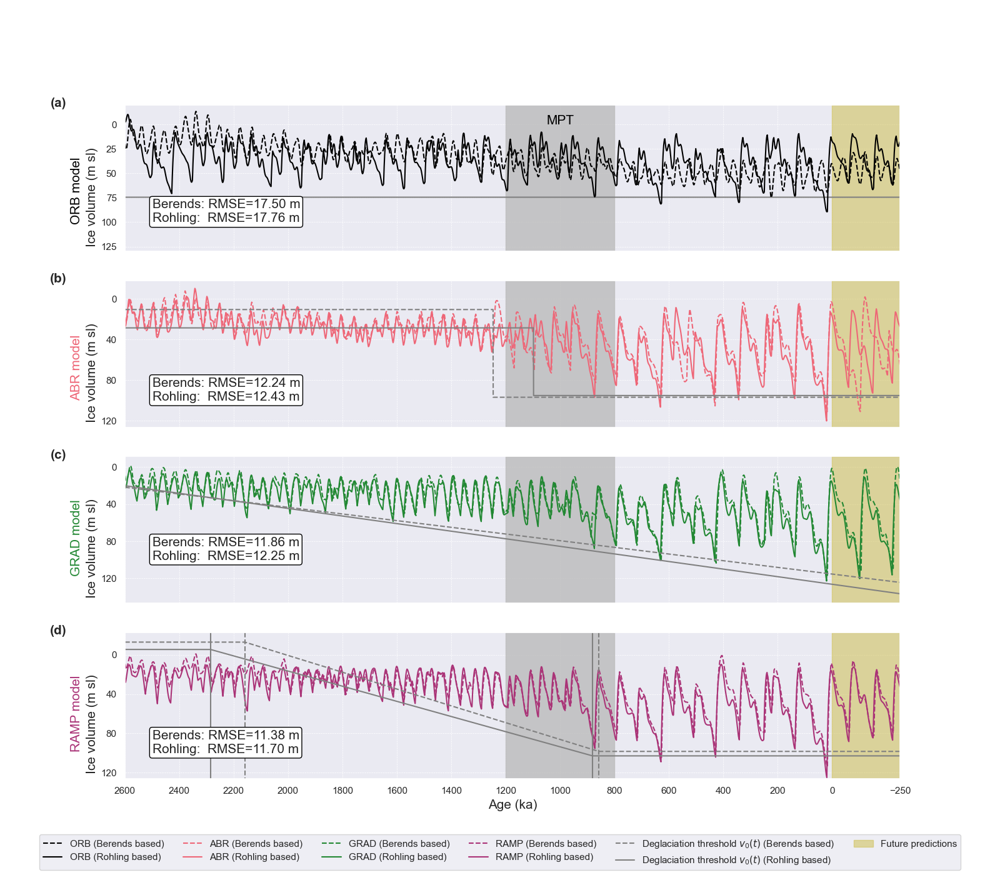

In [55]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(16,14), sharex=True)

##############################################################################################################################################
# 1st plot: ORB
##############################################################################################################################################
# ax[0].plot(ORB_data['time_sea'], ORB_data['sea'], linestyle="-" , color=bright.blue, label="Sea level reconstruction (Berends et al., 2021)")
ax[0].plot(ORB_data['time_bounds'], ORB_data['v0s'], linestyle="--" , color='grey')
ax[0].plot(ORB_data_rohling['time_bounds'], ORB_data_rohling['v0s'], linestyle="-" , color='grey')
ax[0].plot(ORB_data['time'], ORB_data['icevolume'], color=bright.black, linestyle='--', label="ORB (Berends based)")
ax[0].plot(ORB_data_rohling['time'], ORB_data_rohling['icevolume'], color=bright.black, label="ORB (Rohling based)")
ax[0].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[0].axvspan(0, -250, color=bright.yellow, alpha=0.5)


ax[0].text(x=1050, y=0, s='MPT', color=bright.black, fontsize=font)
ax[0].text(x=2500, y=100, s=f"Berends: RMSE={rmse_orb:.2f} m\nRohling:  RMSE={rmse_orb_rohling:.2f} m", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[0].set_xlim(-ORB_data['start_year'],-ORB_data['future_time'])
# ax[0].set_ylim(np.min([np.min(ORB_data['v0']), np.min(ORB_data['icevolume']), np.min(ORB_data['sea'])])-10,
#                np.max([np.max(ORB_data['v0']), np.max(ORB_data['icevolume']), np.max(ORB_data['sea'])])+10)

ax[0].set_ylim(-20, 130)

ax[0].invert_yaxis()
# ax[0].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[0].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[0].transAxes, fontsize=font)
ax[0].text(-0.07, 0.2, 'ORB model', color=bright.black, rotation=90, transform=ax[0].transAxes, fontsize=font)



##############################################################################################################################################
# 2nd plot: ABR
##############################################################################################################################################
# ax[1].plot(ABR_data['time_sea'], ABR_data['sea'], linestyle="-" , color=bright.blue)
ax[1].plot(ABR_data['time'], ABR_data['icevolume'], color=bright.red, linestyle='--', label="ABR (Berends based)")
ax[1].plot(ABR_data_rohling['time'], ABR_data_rohling['icevolume'], color=bright.red, label="ABR (Rohling based)")
# ax[1].vlines(x=ABR_data['ageMPT'], ymin=ABR_data['v0s'].min()-30, ymax=130, linestyle='--', color=bright.black)
# ax[1].vlines(x=ABR_data_rohling['ageMPT'], ymin=ABR_data['v0s'].min()-30, ymax=130, linestyle='-', color=bright.black)
ax[1].plot(ABR_data['time_bounds'], ABR_data['v0s'], linestyle="--" , color='grey')
ax[1].plot(ABR_data_rohling['time_bounds'], ABR_data_rohling['v0s'], linestyle="-" , color='grey')
ax[1].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[1].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[1].set_yticks([0, 40, 80, 120])

ax[1].text(x=2500, y=100, s=f"Berends: RMSE={rmse_abr:.2f} m\nRohling:  RMSE={rmse_abr_rohling:.2f} m", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[1].set_xlim(-ABR_data['start_year'],-ABR_data['future_time'])
ax[1].set_ylim(np.min([np.min(ABR_data['v0s']), np.min(ABR_data['icevolume']), np.min(ABR_data['sea'])])-10,
               np.max([np.max(ABR_data['v0s']), np.max(ABR_data['icevolume']), np.max(ABR_data['sea'])])+10)

ax[1].invert_yaxis()
# ax[1].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[1].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[1].transAxes, fontsize=font)
ax[1].text(-0.07, 0.2, 'ABR model', color=bright.red, rotation=90, transform=ax[1].transAxes, fontsize=font)


##############################################################################################################################################
# 3rd plot: GRAD
##############################################################################################################################################
# ax[2].plot(GRAD_data['time_sea'], GRAD_data['sea'], linestyle="-" , color=bright.blue)
ax[2].plot(GRAD_data['time'], GRAD_data['icevolume'], color=bright.green, linestyle='--', label="GRAD (Berends based)")
ax[2].plot(GRAD_data_rohling['time'], GRAD_data_rohling['icevolume'], color=bright.green, label="GRAD (Rohling based)")
ax[2].plot(GRAD_data['time_bounds'], GRAD_data['v0s'], linestyle="-" , color='grey')
ax[2].plot(GRAD_data_rohling['time_bounds'], GRAD_data_rohling['v0s'], linestyle="--" , color='grey')
ax[2].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[2].axvspan(0, -250, color=bright.yellow, alpha=0.5)

ax[2].set_yticks([0, 40, 80, 120])


ax[2].text(x=2500, y=100, s=f"Berends: RMSE={rmse_grad:.2f} m\nRohling:  RMSE={rmse_grad_rohling:.2f} m", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[2].set_xlim(-GRAD_data['start_year'],-GRAD_data['future_time'])
ax[2].set_ylim(np.min([np.min(GRAD_data['v0s']), np.min(GRAD_data['icevolume']), np.min(GRAD_data['sea'])])-10,
               np.max([np.max(GRAD_data['v0s']), np.max(GRAD_data['icevolume']), np.max(GRAD_data['sea'])])+10)

ax[2].invert_yaxis()
# ax[2].set_ylabel("Ice volume (m sl)", fontsize=font)
ax[2].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[2].transAxes, fontsize=font)
ax[2].text(-0.07, 0.2, 'GRAD model', color=bright.green, rotation=90, transform=ax[2].transAxes, fontsize=font)


##############################################################################################################################################
# 4th plot: RAMP
##############################################################################################################################################
# ax[3].plot(RAMP_data['time_sea'], RAMP_data['sea'], linestyle="-" , color=bright.blue)
ax[3].plot(RAMP_data['time'], RAMP_data['icevolume'], color=bright.purple, linestyle='--', label="RAMP (Berends based)")
ax[3].plot(RAMP_data_rohling['time'], RAMP_data_rohling['icevolume'], color=bright.purple, label="RAMP (Rohling based)")
ax[3].plot(RAMP_data['time_bounds'], RAMP_data['v0s'], linestyle="--" , color='grey', label=r"Deglaciation threshold $v_0(t)$ (Berends based)")
ax[3].plot(RAMP_data_rohling['time_bounds'], RAMP_data_rohling['v0s'], linestyle="-" , color='grey', label=r"Deglaciation threshold $v_0(t)$ (Rohling based)")
# ax[3].vlines(x=RAMP_data['t2'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'Start of RAMP: t2={int(RAMP_data['t2'])} kyr')
ax[3].vlines(x=RAMP_data['t2'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='--', color='grey')
ax[3].vlines(x=RAMP_data['t1'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='--', color='grey')
ax[3].vlines(x=RAMP_data_rohling['t2'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color='grey')
ax[3].vlines(x=RAMP_data_rohling['t1'], ymin=RAMP_data['v0s'].min()-10, ymax=130, linestyle='-', color='grey')

# ax[3].vlines(x=RAMP_data['t1'], ymin=np.min([np.min(RAMP_data['icevolume']-10),np.min(RAMP_data['v0s'])-10]), ymax=np.max([np.max(RAMP_data['icevolume']+10),RAMP_data['v0s']+10]), linestyle='-', color=bright.green, label=f'End of RAMP: t1={int(RAMP_data['t1'])} kyr')
ax[3].axvspan(1200, 800, color=bright.grey, alpha=0.8)
ax[3].axvspan(0, -250, color=bright.yellow, alpha=0.5, label='Future predictions')

ax[3].set_yticks([0, 40, 80, 120])


ax[3].text(x=2500, y=100, s=f"Berends: RMSE={rmse_ramp:.2f} m\nRohling:  RMSE={rmse_ramp_rohling:.2f} m", fontsize=font, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

ax[3].set_xlim(-RAMP_data['start_year'],-RAMP_data['future_time'])
ax[3].set_ylim(np.min([np.min(RAMP_data['v0s']), np.min(RAMP_data['icevolume']), np.min(RAMP_data['sea'])])-10,
               np.max([np.max(RAMP_data['v0s']), np.max(RAMP_data['icevolume']), np.max(RAMP_data['sea'])])+10)


ax[3].invert_yaxis()
# ax[3].set_ylabel("GRAD model\nIce volume (m sl)", fontsize=font)

# ax[3].set_ylabel(r"$\color{red}{\text{GRAD}}$ model" + "\nIce volume (m sl)", fontsize=font)
ax[3].text(-0.05, 0.05, 'Ice volume (m sl)', rotation=90, transform=ax[3].transAxes, fontsize=font)
ax[3].text(-0.07, 0.2, 'RAMP model', color=bright.purple, rotation=90, transform=ax[3].transAxes, fontsize=font)


##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################

ax[3].set_xticks([2600,2400,2200,2000,1800,1600,1400,1200,1000,800,600,400,200,0, -250])
ax[3].set_xlabel("Age (ka)", fontsize=font)
# ax[0].grid(False)
# ax[1].grid(False)
# ax[2].grid(False)
# ax[3].grid(False)


# Add panel label 
panel_label =['(a)', '(b)', '(c)', '(d)']
for i in range(4):
    ax[i].text(-0.075, 1.05, panel_label[i], transform=ax[i].transAxes, fontsize=font, fontweight='bold', va='top', ha='right')
    ax[i].grid(True, which='both', linestyle='--', linewidth=0.5)

fig.legend(ncol=6, loc=8, fontsize=font-4)

if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f13.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()

## A.6. Figure A.6 - Bound Plot for RAMP-l model for MPT 

In [56]:
# load pickled data sets
with open('Data/RAMP23_2,6Myr.pkl_data', 'rb') as file:
    RAMPl_data = pickle.load(file)

params = RAMPl_data['params']
time = RAMPl_data['time']
Esi = np.array(RAMPl_data['Esi'][::2])
Eco = np.array(RAMPl_data['Eco'][::2])
EnO = np.array(RAMPl_data['EnO'][::2])
esinomega = np.array(RAMPl_data['esinomega'])
ecosomega = np.array(RAMPl_data['ecosomega'])
O = np.array(RAMPl_data['O'])
icevolume = RAMPl_data['icevolume']

insolation_alpha = params['aEsi']*Esi + params['aEco']*Eco + params['aO']*EnO

insolation_k = params['kEsi']*Esi + params['kEco']*Eco + params['kO']*EnO

insolation_l = [params['lEsi']*icevolume[i]*Esi[i] + params['lEco']*icevolume[i]*Eco[i] + params['lO']*icevolume[i]*EnO[i] for i in range(len(icevolume))]

insolation_threshold_precession = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i]  for i in range(len(icevolume))]

insolation_threshold_obliquity = [(params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

insolation_threshold = [(params['kEsi']+params['lEsi']*icevolume[i])*Esi[i] + (params['kEco']+params['lEco']*icevolume[i])*Eco[i] + (params['kO']+params['lO']*icevolume[i])*EnO[i] for i in range(len(icevolume))]

print(RAMPl_data['rmse'])

10.022636700269848


In [57]:
mask = []
states = np.where(np.array(RAMPl_data['state'])==1, True, False)
        
state_times = RAMPl_data['time'][states]
state_times = state_times[state_times>=0]
state_times[-100:]

array([608., 607., 530., 529., 528., 527., 526., 525., 524., 523., 522.,
       521., 520., 519., 518., 517., 516., 426., 425., 424., 423., 422.,
       421., 420., 419., 418., 417., 416., 415., 414., 337., 336., 335.,
       334., 333., 332., 331., 330., 329., 328., 327., 326., 325., 324.,
       323., 322., 321., 320., 244., 243., 242., 241., 240., 239., 238.,
       237., 236., 235., 234., 233., 232., 231., 230., 229., 132., 131.,
       130., 129., 128., 127., 126., 125., 124., 123., 122., 121., 120.,
       119., 118., 117., 116., 115., 114., 113.,  15.,  14.,  13.,  12.,
        11.,  10.,   9.,   8.,   7.,   6.,   5.,   4.,   3.,   2.,   1.,
        -0.])

In [58]:
# Function to find continuous intervals
def find_intervals(time_array):
    intervals = []
    start = time_array[0]

    # step size
    step = RAMPl_data['resolution']*1e-3
    
    for i in range(1, len(time_array)):
        if not math.isclose(time_array[i], time_array[i-1]-step):
        # if time_array[i]==time_array[i-1]-1:
            intervals.append((time_array[i-1], start))
            start = time_array[i]
    intervals.append((time_array[-1], start))
    return intervals

# Find glacial intervals
interglacial_intervals = find_intervals(state_times)
interglacial_intervals

[(2575.0, 2594.0),
 (2551.0, 2563.0),
 (2503.0, 2523.0),
 (2461.0, 2480.0),
 (2407.0, 2439.0),
 (2374.0, 2397.0),
 (2333.0, 2352.0),
 (2316.0, 2324.0),
 (2288.0, 2308.0),
 (2261.0, 2278.0),
 (2218.0, 2236.0),
 (2201.0, 2208.0),
 (2172.0, 2193.0),
 (2126.0, 2146.0),
 (2104.0, 2119.0),
 (2051.0, 2076.0),
 (2032.0, 2041.0),
 (2022.0, 2027.0),
 (1995.0, 2002.0),
 (1973.0, 1989.0),
 (1933.0, 1950.0),
 (1917.0, 1922.0),
 (1883.0, 1907.0),
 (1841.0, 1858.0),
 (1818.0, 1834.0),
 (1767.0, 1788.0),
 (1727.0, 1742.0),
 (1675.0, 1701.0),
 (1634.0, 1648.0),
 (1620.0, 1623.0),
 (1594.0, 1609.0),
 (1555.0, 1571.0),
 (1514.0, 1530.0),
 (1480.0, 1496.0),
 (1437.0, 1456.0),
 (1388.0, 1406.0),
 (1347.0, 1362.0),
 (1309.0, 1319.0),
 (1271.0, 1287.0),
 (1230.0, 1246.0),
 (1182.0, 1189.0),
 (1154.0, 1169.0),
 (1104.0, 1117.0),
 (1061.0, 1076.0),
 (1017.0, 1030.0),
 (974.0, 981.0),
 (944.0, 960.0),
 (880.0, 886.0),
 (853.0, 866.0),
 (778.0, 791.0),
 (707.0, 717.0),
 (607.0, 626.0),
 (516.0, 530.0),
 (414.0, 

In [59]:
# Calculate Terminations (durations)
terminations = len(interglacial_intervals) + 1
# first glacial (if exist)
Ts = {'T1': interglacial_intervals[-1][0]-0}

for i in range(terminations-2):
    Ts[f'T{i+2}'] = interglacial_intervals[-(i+2)][0] - interglacial_intervals[-(i+1)][1] - 1

# last glacial (if exist)
Ts[f'T{terminations}'] = -RAMPl_data['start_year'] - interglacial_intervals[0][1]

Ts

{'T1': -0.0,
 'T2': 97.0,
 'T3': 96.0,
 'T4': 75.0,
 'T5': 76.0,
 'T6': 89.0,
 'T7': 76.0,
 'T8': 80.0,
 'T9': 60.0,
 'T10': 61.0,
 'T11': 13.0,
 'T12': 57.0,
 'T13': 13.0,
 'T14': 35.0,
 'T15': 30.0,
 'T16': 27.0,
 'T17': 36.0,
 'T18': 12.0,
 'T19': 40.0,
 'T20': 24.0,
 'T21': 21.0,
 'T22': 27.0,
 'T23': 25.0,
 'T24': 30.0,
 'T25': 23.0,
 'T26': 17.0,
 'T27': 24.0,
 'T28': 22.0,
 'T29': 10.0,
 'T30': 10.0,
 'T31': 26.0,
 'T32': 25.0,
 'T33': 24.0,
 'T34': 29.0,
 'T35': 6.0,
 'T36': 24.0,
 'T37': 9.0,
 'T38': 10.0,
 'T39': 22.0,
 'T40': 5.0,
 'T41': 19.0,
 'T42': 4.0,
 'T43': 9.0,
 'T44': 27.0,
 'T45': 6.0,
 'T46': 25.0,
 'T47': 7.0,
 'T48': 9.0,
 'T49': 24.0,
 'T50': 9.0,
 'T51': 7.0,
 'T52': 8.0,
 'T53': 21.0,
 'T54': 9.0,
 'T55': 21.0,
 'T56': 22.0,
 'T57': 27.0,
 'T58': 11.0,
 'T59': 6.0}

In [60]:
glacial_end_idx = []
glacial_ends = []
step = RAMPl_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMPl_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

print(glacial_ends[:5], glacial_end_idx[:5])

[2595.0, 2564.0, 2524.0, 2481.0, 2440.0] [5, 36, 76, 119, 160]


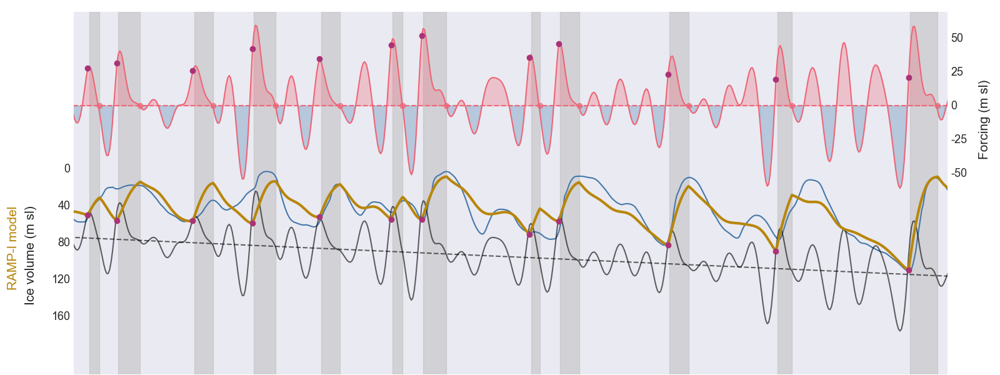

In [62]:
font = 15
title = None

# use seaborn theme
# sns.set_theme()
sns.set_style("dark")

# switch off seaborn theme
# plt.rcdefaults()

plt.close('all')
fig, ax1 = plt.subplots(nrows=1, figsize=(16,6))
fig.tight_layout(pad=7.0)


##############################################################################################################################################
# 2nd subbplot: Ice volume + Bounds
##############################################################################################################################################
ax1.plot(RAMPl_data['time_sea'], RAMPl_data['sea'], linestyle="-" , color=bright.blue, label='Berends et al. (2021)')
ax1.plot(RAMPl_data['time'], RAMPl_data['icevolume'], color='darkgoldenrod', label="RAMP-l v(t)", linewidth=3, zorder=9)
ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0s'], color=bright.black, linestyle='--', alpha=0.6, label=r"$v_0(t)$")
ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0_bounds'], color=bright.black, linestyle='-', alpha=0.6, label=r"Degl. threshold: $v_0(t)-\tilde{I}_k(t)$")


# # with markers
# ax1.plot(RAMPl_data['time'], RAMPl_data['icevolume'], color=bright.blue, marker='o', label="RAMP model v(t)", linewidth=3, zorder=9)
# ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v0_bounds'], color=bright.black, marker='o', linestyle='-', alpha=0.6, label=f"Deglaciation threshold")
# ax1.plot(RAMPl_data['time_bounds'], RAMPl_data['v1_bounds'], color=bright.red, marker='o', alpha=1, label="Insolation")
# ax1.axvspan(1200, 800, color=bright.grey, alpha=0.8)

# marks intersection points between v and v_0(t) (manually indentified)
# intersections = [[426,102.2], [337,71.5], [245,79.25], [219,57.1], [131,80.367], [17, 117.5]]
# for i, intersect in enumerate(intersections):
#     if i==len(intersections)-1:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10, label='v(t) > Degl. threshold')
#     else:
#         ax1.scatter(intersect[0], intersect[1], marker='o', color=bright.purple, zorder=10)

# mark intersection points between v and v_0(t)
# at first get indices of end points of glacial states
glacial_end_idx = []
glacial_ends = []
step = RAMPl_data['resolution']*1e-3
for interglacial_start in np.array(interglacial_intervals)[:,1]:
    glacial_end = interglacial_start+step
    idx = int((abs(RAMPl_data['start_year'])-glacial_end)/step)

    glacial_ends.append(glacial_end)
    glacial_end_idx.append(idx)

ax1.scatter(glacial_ends, RAMPl_data['icevolume'][glacial_end_idx], color=bright.purple, zorder=10, label='v(t) > Degl. threshold')


ax2 = ax1.twinx()
ax2.hlines(xmin=1200, xmax=600, y=RAMPl_data['v1'], linestyle='--', color=bright.red, alpha=1, label=r"$v_1$")
ax2.plot(RAMPl_data['time'], insolation_threshold, color=bright.red, alpha=1, label=r"Forcing $\tilde{I}_k(t)$")

# shade the area where insolation>=v1
ax2.fill_between(x=RAMPl_data['time_bounds'], y1=RAMPl_data['v1_bounds'], y2=RAMPl_data['v1'], where=(RAMPl_data['v1_bounds'] >= RAMPl_data['v1']), color=bright.red, alpha=0.3, label=r'$\tilde{I}_k\geq$ $v_1$')

# shade the area where insolation<v1
ax2.fill_between(x=RAMPl_data['time_bounds'], y1=RAMPl_data['v1_bounds'], y2=RAMPl_data['v1'], where=(RAMPl_data['v1_bounds'] < RAMPl_data['v1']), color=bright.blue, alpha=0.3, label=r'$\tilde{I}_k < v_1$')


# mark position at end of interglacial for v1 
for interglacial_end in np.array(interglacial_intervals)[:,0]:
    ax2.scatter(interglacial_end, RAMPl_data['v1'], color=bright.red, alpha=0.7, zorder=10)

ax2.scatter(glacial_ends, RAMPl_data['v1_bounds'][glacial_end_idx], color=bright.purple, zorder=10)

# Shade interglacial intervals
terminations = [
    "I", "II", "III", "IV", "V", "VI", "VII", "VIII", "IX", "X",
    "XI", "XII", "XIII", "XIV", "XV", "XVI", "XVII", "XVIII", "XIX", "XX",
    "XXI", "XXII", "XXIII", "XXIV", "XXV"]
for i, interval in enumerate(interglacial_intervals[::-1]):
    if i==0:
        ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5, label='Deglaciation')
    ax1.axvspan(interval[1], interval[0], color=bright.grey, alpha=0.5)
    # if i>7 and i<19:
    #     plt.text((interval[1]+interval[0])/2, -65, f'T{terminations[i]}', rotation=0, horizontalalignment='center', alpha=0.6, fontsize=font-2)


ax1.invert_yaxis()
ax1.invert_xaxis()

# ax1.set_yticks(ticks=[-170, 0, 20, 40, 60, 80, 100, 120], labels=['', '0', '20', '40', '60', '80', '100', '120'], fontsize=font)
ax1.set_yticks(ticks=[-170, 0, 40, 80, 120, 160], labels=['', '0', '40', '80', '120', '160'], fontsize=font-2)
ax2.set_yticks(ticks=[-200, -50, -25, 0, 25, 50], labels=['', '-50', '-25', '0', '25', '50'], fontsize=font-2)
ax1.yaxis.set_tick_params(length=0,labelbottom=True)
ax2.yaxis.set_tick_params(length=0,labelbottom=False)

ax1.text(-0.055, 0.20, 'Ice volume (m sl)', rotation=90, transform=ax1.transAxes, fontsize=font)
ax1.text(-0.075, 0.24, 'RAMP-l model', color='darkgoldenrod', rotation=90, transform=ax1.transAxes, fontsize=font)
ax2.text(1.035, 0.60, 'Forcing (m sl)', rotation=90, transform=ax2.transAxes, fontsize=font)
# ax2.set_ylabel('Forcing (m sl)', fontsize=font)


##############################################################################################################################################
##############################################################################################################################################
##############################################################################################################################################


# plt.xticks([2000,1800,1600,1400,1200,1000,800,600,400,200,0])
ax1.set_xlabel("Age (ka)", fontsize=font)
ax1.set_xticks(ticks=np.arange(1200, 600-1, -100), labels=['1200', '1100', '1000', '900', '800', '700', '600'], fontsize=font-2)
plt.xlim(1200,600)
# plt.ylim(150,-80)
# plt.xlim(1950,1920)
# plt.xlim(500,0)
# plt.xlim(0,-250)
# plt.xlim(-RAMPl_data['start_year'], -RAMPl_data['future_time'])


# Add label for glaciation state
glacial_label = mpatches.Patch(facecolor=plt.gca().get_facecolor(), edgecolor='grey', label='Glaciation')

# Get the current handles and labels, add glacial_label
handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
handles = np.hstack([handles_ax1, handles_ax2, glacial_label])
labels = np.hstack([labels_ax1, labels_ax2, 'Glaciation'])

# change position in legend, s.t. 'Deglaciation' and 'Glaciation' are adjacent -> looks nicer
def change_pos(in_arr, pick_idx, put_idx ):  
    new_arr = in_arr.copy()
    range_arr = np.arange(in_arr.size)  
    tmp = in_arr[pick_idx]
    new_arr[range_arr != put_idx ] = in_arr[range_arr != pick_idx]
    new_arr[put_idx] = tmp
    return new_arr

handles = list(change_pos(handles, 5, 9))
labels = list(change_pos(labels, 5, 9))


fig.legend(handles=handles, labels=labels, ncol=6, bbox_to_anchor=(0.5, -0.08), loc='upper center', fontsize=font-2)


# fig.legend(ncol=5, loc=8, fontsize=font)
plt.tight_layout()
plt.subplots_adjust(bottom=0.0)  
if title!=None:
    plt.title(title, fontsize=15)

plt.savefig('Plots/f14.pdf', bbox_inches='tight', facecolor=(1,1,1,0))
plt.show()